# LENDING CLUB CASE STUDY
## Goal -
- If one is able to identify these risky loan applicants, then such loans can be reduced thereby cutting down the amount of credit loss. Identification of such applicants using EDA is the aim of this case study.

 

- In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.express as px
import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import math

pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', None)

### Helper function

In [2]:
def column_meaning(column_name):
    '''Returns meainng of the column from data deoctionary provided
    '''
    meta_data = pd.read_excel('../data/Data_Dictionary.xlsx')
    meta_data.columns = ['column_name', 'description']
    return meta_data[meta_data['column_name']==column_name]['description'].values[0]

In [3]:
def univariate(df,column_name,title):
    ''' plots bar plot for categorical features
    '''
    value_count = df[column_name].value_counts()
    tempdf = pd.DataFrame({'category': value_count.index,'count':value_count})
    fig = px.bar(tempdf,x ='category',y = 'count',color='category',title =title)
    fig.show()

In [4]:
def insights(column_name,df):
    typ = df[column_name].dtype
    null_val = df[column_name].value_counts
    print("type: ",typ)
    print("null value count: ",null_val)

In [5]:
def upper_lower_fence(df,col):
    sns.boxplot(data=df, x=col)
    plt.show()
    describe = df[col].describe()
    Q1 = describe['25%']
    Q3 = describe['75%']
    min_value = describe['min']
    max_value = describe['max']
    IQR = Q3-Q1
    Upper_fence = min(Q3 + (1.5 * IQR), max_value) 
    Lower_fence = max(Q1 - (1.5 * IQR), min_value)
    print(F'{col} -> (Lower Fence = {Lower_fence}, Upper Fence = {Upper_fence})')
    return Upper_fence,Lower_fence

In [6]:
def log_normal_univariate(numeric_df,col,title):

    fig = make_subplots(rows=1,
                        cols=2,vertical_spacing=1.0,
                        subplot_titles=('normal scale',  'log scale'))

    fig.add_trace(
       go.Bar(y=numeric_df[col].value_counts(), x=numeric_df[col].value_counts().index,name = "normal scale"
                ),1,1
    )

    fig.add_trace(
       go.Bar(y=numeric_df[col].value_counts().apply(lambda x:math.log(x,10)), x=numeric_df[col].value_counts().index,name= "log scale"
                ),1,2
    )

    fig.update_layout(height=500, width=800, title_text=title)
    for i in range(1,3): 
        fig['layout']['xaxis{}'.format(i)]['title']=col
        fig['layout']['yaxis{}'.format(i)]['title']='frequency'
    fig.show()


In [7]:
def continuous_variable_graphs(df,col,title):
    binn = F'{col}_range'
    
    fig = plt.figure(figsize=(15,15))
    fig.suptitle(title)

    plt.subplot(3, 3, 1)
    ax = sns.boxplot(x=df[col])
    ax.set_title("box plot for outlier detection")

    plt.subplot(3, 3, 2)
    ax = sns.kdeplot(df[col], shade = True)
    ax.set_title("distribution plot to see skewness of data")

    plt.subplot(3, 3, 3)
    ax = sns.histplot(df, x = col, bins = 5)
    ax.set_title("general distribution of data")
    
    if(binn in data_clean.columns.values):
        plt.subplot(3, 3, 5)
        ax = sns.countplot(data=data_clean, y=binn, hue='loan_status')
        ax.set_title('Range category vs Loan Status')

    plt.show()
    print("skew: ",df[col].skew())

In [8]:
def get_column_type(col_name):
    return data[col_name].dtype

In [9]:
def get_sample_value(col_name):
    col = column_analysis[column_analysis.column_name == col_name]
    dtype = col['dtype'].values[0]
    col_value = data[-data[col_name].isna()][col_name].values
    if (dtype == int or dtype == float) and col['missing_value_percent'].values[0] < 100:
        return F'{min(col_value)} | {max(col_value)}'
    elif dtype == object:
        _values = pd.Series(list(map(str,col_value))).unique()
        if(len(_values)/len(data) <= .15):
            return ' | '.join(_values)
        return ' | '.join(_values[:10])
    else:
        return None   

In [10]:
def date_handle(x):
    yr = int(x.split('-')[1])
    if yr>=0 and yr<22:
        return 2000+yr
    else:
        return 1900+yr

In [11]:
def columns_with_fewer_unique_values(df):
    '''
    check for column that have very few unique values, in case of object if only 1 unique value it will not be useful
    '''
    col_list = []
    for ele in df.columns:
        
        if df[ele].unique().shape[0]<4 and df[ele].dtype != object or \
            df[ele].unique().shape[0]<2 and df[ele].dtype == object :
            col_list.append(ele)
    return col_list

In [12]:
def bi_analysis(df, title = "% distribution",fig = (10,7)):
    temp[
        list(temp.columns)
    ].apply(
        lambda x:x/x.sum()*100,
        axis=1
    ).sort_values(
        'Charged Off'
    )['Charged Off'].to_frame().plot(
        kind = "barh",
        figsize = fig,
        title = title
    )
    plt.xlabel("Percent Charged Off")
    plt.show()   

### Read data
- Read the load data file
- Read the column decription file

In [13]:
data = pd.read_csv('../data/loan.csv', low_memory=False)
meta_data = pd.read_excel('../data/Data_Dictionary.xlsx')
meta_data.columns = ['column_name', 'description']

In [14]:
data.info(
    max_cols = 111,
    show_counts = True
)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

### View of loan data
Top 5 rows of load data 

In [15]:
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077501,Borrower added on 12/22/11 > I need to upgrade my business technologies.<br>,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077430,Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike. I only need this money because the deal im looking at is to good to pass up.<br><br> Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike.I only need this money because the deal im looking at is to good to pass up. I have finished college with an associates degree in business and its takingmeplaces<br>,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077175,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

# Data Cleaning

<br></br>
**Current in loan status is not usefull for analysis so we can use only charged off and fully paid**

In [16]:
data_clean = data[data.loan_status != 'Current']

In [17]:
data_clean.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077501,Borrower added on 12/22/11 > I need to upgrade my business technologies.<br>,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.0,0.0,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077430,Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike. I only need this money because the deal im looking at is to good to pass up.<br><br> Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike.I only need this money because the deal im looking at is to good to pass up. I have finished college with an associates degree in business and its takingmeplaces<br>,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077175,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [18]:
# ## converting int_rate and revol_utils to proper numerical format by dropping %sign
# data_clean['int_rate'] = data_clean['int_rate'].apply(lambda x: float(x[:-1]))
# data_clean['revol_util'] = data_clean['revol_util'].apply(lambda x: float(x[:-1]))

<br></br>
<b>`Defination`</b>
- *funded_amnt* - The total amount committed to that loan at that point in time.
- *funded_amnt_inv* - The total amount committed by investors for that loan at that point in time

**Validation on loan amount**
- `loan amount should not be greater than funded and apporved amount`

In [19]:
data_clean[data_clean['loan_amnt']<data_clean['funded_amnt']]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit


In [20]:
data_clean[data_clean['loan_amnt']<data_clean['funded_amnt_inv']]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit


<br></br>
<b>`Defination`</b>
- *issue_d* - date when the loan was funded
- *last_pymnt_d* - date when last mayment was recieved

**Validation of loan date**
- `loan issue date should not be greater than last installemt payment date`

In [21]:
data_clean[data_clean['issue_d']>data_clean['last_pymnt_d']].shape[0]

16632

<br></br>
<b>`Defination`</b>
- *out_prncp_inv* - Remaining outstanding principal for portion of total amount funded by investors

**Validation on loan_status**
- `Check if remaing principle amount is zero for fully paid loans`



In [22]:
data_clean[data_clean['loan_status']=='Fully Paid']['out_prncp_inv'].sum()

0.0

<br></br>
<b>`Defination`</b>
- *recoveries* - After a loan has been marked as Default,how much amount was recoveried,for example by selling assets or other ways

**Validation on loan_status**
- `Check if no recoveries made for fully paid account`



In [23]:
data_clean[data_clean['loan_status']=='Fully Paid']['recoveries'].sum()

0.0


<br></br>
<b>`Defination`</b>
- *open_acc*: The number of open credit lines in the borrower's credit file.
- *total_acc*: The total number of credit lines currently in the borrower's credit file

- `ideally open accounts should be less than the total accounts`

**Validation on loan_status**

- `validating number of open account are not greater than total account`

In [24]:
data_clean[data_clean['open_acc']>data_clean['total_acc']]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
39642,127213,85483,2000,2000,1575.0,36 months,7.12%,61.87,A,A1,U.S. Government,10+ years,MORTGAGE,118000.0,Not Verified,Sep-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.action?loan_id=127213,consolidate debt,debt_consolidation,consolidate debt,020xx,MA,0.43,0,Jun-91,0,NaN,NaN,14,0,4709,18.50%,8,f,0.0,0.0,2219.432551,1747.8,2000.0,219.43,0.0,0.0,0.0,Apr-10,3.06,NaN,Apr-10,NaN,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
data_clean = data_clean[~(data_clean['open_acc']>data_clean['total_acc'])]

<br></br>
 **Investigating columns related to loan amount** 

| column name | description |
| --- | --- |
| loan_amnt | The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value. |
| funded_amnt | The total amount committed to that loan at that point in time. |
| funded_amnt_inv | The total amount committed by investors for that loan at that point in time. |
| revol_bal | Total credit revolving balance |
| out_prncp | Remaining outstanding principal for total amount funded |
| out_prncp_inv | Remaining outstanding principal for portion of total amount funded by investors |
| total_pymnt | Payments received to date for total amount funded |
| total_pymnt_inv | Payments received to date for portion of total amount funded by investors |
| total_rec_prncp | Principal received to date |
| total_rec_int | Interest received to date |
| last_pymnt_amnt | Last total payment amount received |

In [26]:
## investigating some numerical columns related to loan amount
loan_amnt_related_columns = [
    'loan_amnt',
    'funded_amnt',
    'funded_amnt_inv',
    'revol_bal',              
    'total_pymnt',
    'total_pymnt_inv',
    'total_rec_prncp',
    'total_rec_int',
    'last_pymnt_amnt'
]
cor = data_clean[loan_amnt_related_columns]

In [27]:
cor.corr()

,loan_amnt,funded_amnt,funded_amnt_inv,revol_bal,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,last_pymnt_amnt
loan_amnt,1.000000,0.981789,0.937920,0.314012,0.881906,0.847630,0.845865,0.728338,0.474606
funded_amnt,0.981789,1.000000,0.956170,0.306491,0.898706,0.864497,0.864078,0.736649,0.478440
funded_amnt_inv,0.937920,0.956170,1.000000,0.286254,0.874726,0.909124,0.838582,0.726731,0.469158
revol_bal,0.314012,0.306491,0.286254,1.000000,0.289284,0.273022,0.276751,0.241971,0.125308
total_pymnt,0.881906,0.898706,0.874726,0.289284,1.000000,0.968579,0.973541,0.822431,0.511528
total_pymnt_inv,0.847630,0.864497,0.909124,0.273022,0.968579,1.000000,0.940297,0.805933,0.500060
total_rec_prncp,0.845865,0.864078,0.838582,0.276751,0.973541,0.940297,1.000000,0.683515,0.567457
total_rec_int,0.728338,0.736649,0.726731,0.241971,0.822431,0.805933,0.683515,1.000000,0.242717
last_pymnt_amnt,0.474606,0.478440,0.469158,0.125308,0.511528,0.500060,0.567457,0.242717,1.000000


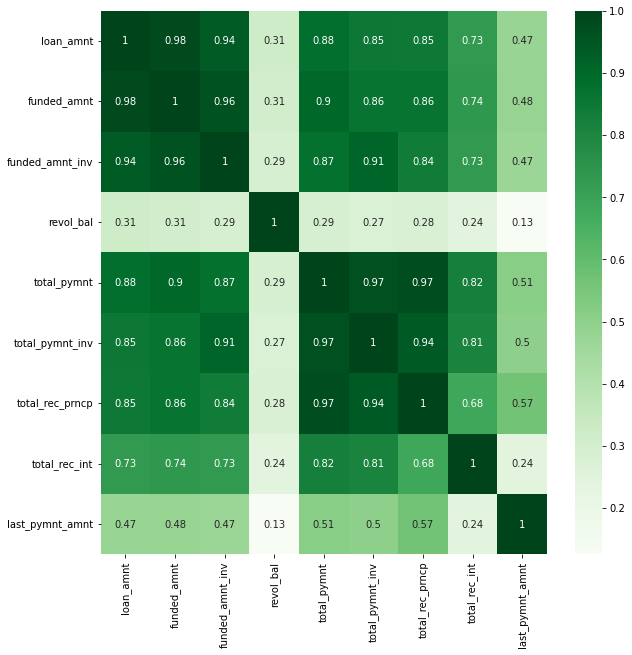

In [28]:
plt.figure(figsize = (10,10))
sns.heatmap(cor.corr(),cmap = 'Greens',annot = True)
plt.show()

`Below 6 columns seem highly corelated to loan amount and also are post loan approval features hence we should drop them`
- funded amount
- funded_amnt_inv
- total_pymnt
- total_pymnt_inv
- total_rec_int
- total_rec_prncp

In [29]:
corelated_to_loan_amnt = [
    'funded_amnt',
    'funded_amnt_inv',
    'total_pymnt',
    'total_pymnt_inv',
    'total_rec_prncp',
    'total_rec_int'
]

data_clean.drop(corelated_to_loan_amnt,axis = 1,inplace = True)

In [30]:
left = list(set(loan_amnt_related_columns)-set(corelated_to_loan_amnt))

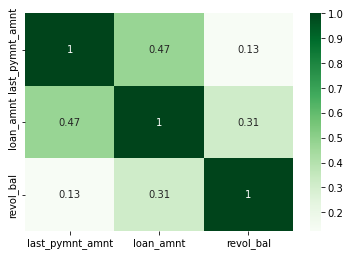

In [31]:
sns.heatmap(data_clean[left].corr(),cmap = 'Greens',annot = True)
plt.show()

<b>`Some other post loan approval features which should be dropped`</b>
 
- <b>last_pymnt_amnt</b>: Last total payment amount received
- <b>out_prncp</b>: Remaining outstanding principal for total amount funded
- <b>out_prncp_inv</b>: Remaining outstanding principal for portion of total amount funded by investors
- <b>total_rec_late_fee</b>: Late fees received to date
- <b>recoveries</b>: After a loan has been marked as Default,how much amount was recoveried,for example by selling assets or other ways
- <b>collection_recovery_fee</b>: money spend by LC for recovery collection
- <b>delinq_2yrs</b>: this column means that how many time the user payed the due amount after 30 days in past 2 yrs

In [32]:
data_clean.drop(
    [
        'collection_recovery_fee',
        'recoveries',
        'delinq_2yrs',
        'total_rec_late_fee',
        'last_pymnt_amnt',
        'out_prncp',
        'out_prncp_inv',
        'last_pymnt_d',
        'last_credit_pull_d',
    ],
    inplace = True,
    axis = 1
)

### Column analysis

Create new data frame for colum analysis where computed following data for each column
- Total number of missing values
- Total % of missing value
- Merged with description data
- Data type of column
- A shample column which store
    - If column is of int or float type then min and max value
    - If column is of object type the few shample values
- New categorical column for missing value categories depends on % of missing values
    - If 0 then VL (very low)
    - If b/w 1 - 10 then L(low)
    - If b/w 11 - 30 then M(medium)
    - If b/w 31 - 80 then H(high)
    - If b/w 81 - 100 then VH(very high)

In [33]:
column_analysis = pd.DataFrame(
    {'missing_value_percent':data_clean.apply(lambda x:round((x.isna().sum()/x.shape[0])*100,2)),
     'total_of_nan':data_clean.isna().sum(),
    'column_name':data_clean.columns}
)

In [34]:
column_analysis.head()

,missing_value_percent,total_of_nan,column_name
id,0.0,0,id
member_id,0.0,0,member_id
loan_amnt,0.0,0,loan_amnt
term,0.0,0,term
int_rate,0.0,0,int_rate


In [35]:
column_analysis.reset_index(inplace = True,drop = True)

In [36]:
column_analysis.head()

,missing_value_percent,total_of_nan,column_name
0,0.0,0,id
1,0.0,0,member_id
2,0.0,0,loan_amnt
3,0.0,0,term
4,0.0,0,int_rate


In [37]:
column_analysis['missing_category'] = pd.cut(
    x = column_analysis['missing_value_percent'], 
    bins= [-1.0, 0.0, 10.0, 30.0,80.0, 100.0],
    labels = [
        'Very Low (0% missing)','Low (1-10% missing)',
        'Medium (11-30% missing)', 
        'High (31-80% missing)',
        'Very High (80-100% missing)'
    ]
)

In [38]:
column_analysis['dtype'] = column_analysis.column_name.apply(get_column_type)

In [39]:
column_analysis.head()

,missing_value_percent,total_of_nan,column_name,missing_category,dtype
0,0.0,0,id,Very Low (0% missing),int64
1,0.0,0,member_id,Very Low (0% missing),int64
2,0.0,0,loan_amnt,Very Low (0% missing),int64
3,0.0,0,term,Very Low (0% missing),object
4,0.0,0,int_rate,Very Low (0% missing),object


In [40]:
missing_category_percentage = pd.pivot_table(
    column_analysis,
    index = 'missing_category',
    values = 'missing_value_percent',
    aggfunc = lambda x:len(x)/len(column_analysis)*100
)

In [41]:
missing_category_percentage.reset_index(inplace = True)

In [42]:
missing_category_percentage

,missing_category,missing_value_percent
0,Very Low (0% missing),31.250000
1,Low (1-10% missing),8.333333
2,High (31-80% missing),2.083333
3,Very High (80-100% missing),58.333333


In [43]:
fig = px.pie(
    missing_category_percentage, 
    values='missing_value_percent', 
    names='missing_category',
    title='Percentage of column under mssing categories(depends on % on value missing)',
    hole=.5,
    color_discrete_sequence=px.colors.sequential.Agsunset_r,
    labels={'missing_category':'Category', 'column_percent': 'Column Percentage'},
)
fig.show()

##### Ploting missing % of columns values category wise

Some intresting insite found
- 50% of columns have 100% missing value
- 1.8% of columns have 31 - 80% missing values
- Only 38.7% of columns have 0% missing values

So decided to go with only those rows which have less then 10% missing value

![Visualization](../data_description/newplot.png)

### Dropping columns with more than 30 percent null values
- Droppping beacuse its not good fill column have more then 30%

In [44]:
column_values_with_more_than_30_percent_missing = list(column_analysis[
    column_analysis['missing_category'].isin([
        'High (31-80% missing)',
        'Very High (80-100% missing)'
    ])
]['column_name'].values)

In [45]:
data_clean = data_clean.drop(column_values_with_more_than_30_percent_missing, axis = 1)

In [46]:
na_count = data_clean.isna().sum()
na_count[na_count > 0]

emp_title                     2386
emp_length                    1033
title                           11
revol_util                      50
collections_12_mths_ex_med      55
chargeoff_within_12_mths        55
pub_rec_bankruptcies           696
tax_liens                       38
dtype: int64

<br></br>
**Check for column that have very few unique values, in case of object if only 1 unique value it will not be useful**

In [47]:
column_list = columns_with_fewer_unique_values(data_clean)

#### Below columns have either 1 unique value or if 2 the other one is Nan hence it doesnot add any information so dropping these columns.



| column name | Unique value array |
| --- | --- |
| initial_list_status | ['f'] |
| collections_12_mths_ex_med | [ 0. nan] |
| policy_code | [1] |
| application_type | ['INDIVIDUAL'] |
| acc_now_delinq | [0] |
| chargeoff_within_12_mths | [ 0. nan] |
| delinq_amnt | [0] |
| tax_liens | [ 0. nan] |

In [48]:
data_clean.drop(column_list,axis=1,inplace = True)

In [49]:
data_clean.shape

(38576, 29)

<br></br>
<b>`Defination`</b>
- **id** : A unique LC assigned ID for the loan listing
- **member_id** : A unique LC assigned Id for the borrower member.
- **url** : URL for the LC page with listing data.
- **desc**: String column containing loan description

<b>`Findings`</b>
- url has redundant information with id column
- all these column donot add any meaning to our analysis
- **Dropping unnecessary columns**

In [50]:
data_clean.drop(['id', 'member_id','url'], axis = 1, inplace = True)

## Handling missing values
**----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**


In [51]:
data_clean.isna().sum()

loan_amnt                  0
term                       0
int_rate                   0
installment                0
grade                      0
sub_grade                  0
emp_title               2386
emp_length              1033
home_ownership             0
annual_inc                 0
verification_status        0
issue_d                    0
loan_status                0
purpose                    0
title                     11
zip_code                   0
addr_state                 0
dti                        0
earliest_cr_line           0
inq_last_6mths             0
open_acc                   0
pub_rec                    0
revol_bal                  0
revol_util                50
total_acc                  0
pub_rec_bankruptcies     696
dtype: int64


### title ###
<b>`Defination`</b>
- *title* - The loan title provided by the borrower

<b>`Findings`</b>
- large amount of unique string values which cant be put into categories
- **Dropping** this column


In [52]:
column_meaning('title')

'The loan title provided by the borrower'

In [53]:
data_clean.drop(['title'], axis=1, inplace=True)


### pub_rec_bankruptcies ###
<b>`Defination`</b>
- this column meanins that how many times the borrower has filled for bankrupties in public domain knowledge

<b>`Findings`</b>
- column contains 696 nan values
- as most of the values are 0.0 we will be imputing the data with it

In [54]:
data_clean[
    data_clean['pub_rec_bankruptcies'].isna()
].loan_status.value_counts() / data_clean.loan_status.value_counts()*100

Fully Paid     1.754226
Charged Off    2.097032
Name: loan_status, dtype: float64

In [55]:
data_clean.loan_status.value_counts() / len(data_clean)*100

Fully Paid     85.41321
Charged Off    14.58679
Name: loan_status, dtype: float64

In [56]:
data_clean['pub_rec_bankruptcies'].fillna(data_clean['pub_rec_bankruptcies'].median(),inplace = True)

In [57]:
data_clean['pub_rec_bankruptcies'].isna().sum()

0

### SOMETHING
<!-- <br></br>
***pub_rec_bankruptcies***
- **14% of data only belong to charged off and droping 2% from it will affect the analysis**
- **85% data belong to fully paid so droping 2% from it for NaN will not affect the analysis**  -->

In [58]:
# data_clean = data_clean[-((data_clean['pub_rec_bankruptcies'].isna()) & (data_clean['loan_status'] == 'Fully Paid'))]

In [59]:
# data_clean.pub_rec_bankruptcies.value_counts()

In [60]:
# data_clean[
#     data_clean.loan_status == "Charged Off"
# ].pub_rec_bankruptcies.value_counts() / data_clean.pub_rec_bankruptcies.value_counts()

### SOMETHING
<!-- **So from above data, putting NaN of** *pub_rec_bankruptcies* **will lead inconsistency in data for analysis because data is skewed** -->


### revol_util  ###
<b>`Defination`</b>
- *revol_util* - Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.


<b>`Findings`</b>
- 0.12 % data is misiing hence we can safely drop these columns
- cleaning for values as they contain % symbol at end

In [61]:
column_meaning('revol_util')

'Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.'

In [62]:
col = 'revol_util'
print("Percent null values in revol_util column: ",data_clean[col].isna().sum()/data_clean[col].shape[0]*100)

data_clean[col].shape[0]

data_clean = data_clean.dropna(subset = [col])

data_clean[col].shape[0]

Percent null values in revol_util column:  0.1296142679386147


38526

In [63]:
data_clean['revol_util'] = data_clean['revol_util'].apply(lambda x: float(x[:-1]))


### emp_title ###

<b>`Defination`</b>
- *emp_title* : The job title supplied by the Borrower when applying for the loan.

<b>`Findings`</b>
- contains alot of unique values 27k around
- We can **drop** emp_title column (values are string not a category)



In [64]:
column_meaning('emp_title')

'The job title supplied by the Borrower when applying for the loan.*'

In [65]:
data_clean['emp_title'].unique().shape

(27989,)

In [66]:
data_clean.drop(['emp_title'], axis = 1, inplace = True)


### emp_length ###
<b>`Defination`</b>
- *emp_length*: length of employemnet for the borrower

<b>`Findings and actions`</b>
- Looking into graph there is only 2% average chages, so we can fill it with unknown category
- Instead of dropping nan values we create another category **Unkown** to signify all nan values

In [67]:
col = 'emp_length'
print("Percent null values in {0} column: {1}%".format(col,round(data_clean[col].isna().sum()/data_clean[col].shape[0]*100,2)))

Percent null values in emp_length column: 2.67%


In [68]:
data_clean['emp_length'] = data_clean['emp_length'].fillna('Unknown')

In [69]:
data_clean.isna().sum()

loan_amnt               0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
zip_code                0
addr_state              0
dti                     0
earliest_cr_line        0
inq_last_6mths          0
open_acc                0
pub_rec                 0
revol_bal               0
revol_util              0
total_acc               0
pub_rec_bankruptcies    0
dtype: int64

In [70]:
data_clean.shape

(38526, 24)

## Creating Derived columns and fix dtype
**----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**


In [71]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38526 entries, 0 to 39716
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             38526 non-null  int64  
 1   term                  38526 non-null  object 
 2   int_rate              38526 non-null  object 
 3   installment           38526 non-null  float64
 4   grade                 38526 non-null  object 
 5   sub_grade             38526 non-null  object 
 6   emp_length            38526 non-null  object 
 7   home_ownership        38526 non-null  object 
 8   annual_inc            38526 non-null  float64
 9   verification_status   38526 non-null  object 
 10  issue_d               38526 non-null  object 
 11  loan_status           38526 non-null  object 
 12  purpose               38526 non-null  object 
 13  zip_code              38526 non-null  object 
 14  addr_state            38526 non-null  object 
 15  dti                

In [72]:
data_clean['int_rate'] = data_clean['int_rate'].apply(
    lambda x: float(x.replace('%', ''))
)

In [73]:
data_clean['grade_sublevel_number'] = data_clean['sub_grade'].apply(
    lambda x: x[-1]
)

In [74]:
data_clean['issue_d_month'] = data_clean['issue_d'].apply(lambda x:x.split('-')[0])
data_clean['issue_d_year'] = data_clean['issue_d'].apply(date_handle)

In [75]:
data_clean['loan_income_ratio'] = round(data_clean['loan_amnt'] / data_clean['annual_inc'] * 100, 2)

In [76]:
data_clean['open_to_total_credit_line_ratio'] = data_clean['open_acc']/data_clean['total_acc']*100

In [77]:
data_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,grade_sublevel_number,issue_d_month,issue_d_year,loan_income_ratio,open_to_total_credit_line_ratio
0,5000,36 months,10.65,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860xx,AZ,27.65,Jan-85,1,3,0,13648,83.7,9,0.0,2,Dec,2011,20.83,33.333333
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309xx,GA,1.00,Apr-99,5,3,0,1687,9.4,4,0.0,4,Dec,2011,8.33,75.000000
2,2400,36 months,15.96,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606xx,IL,8.72,Nov-01,2,2,0,2956,98.5,10,0.0,5,Dec,2011,19.59,20.000000
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917xx,CA,20.00,Feb-96,1,10,0,5598,21.0,37,0.0,1,Dec,2011,20.33,27.027027
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,wedding,852xx,AZ,11.20,Nov-04,3,9,0,7963,28.3,12,0.0,4,Dec,2011,13.89,75.000000


In [78]:
data_clean['earliest_cr_line_month'] = data_clean['earliest_cr_line'].apply(lambda x:x.split('-')[0])
data_clean['earliest_cr_line_year'] = data_clean['earliest_cr_line'].apply(date_handle)

In [79]:
data_clean.isna().sum()

loan_amnt                          0
term                               0
int_rate                           0
installment                        0
grade                              0
sub_grade                          0
emp_length                         0
home_ownership                     0
annual_inc                         0
verification_status                0
issue_d                            0
loan_status                        0
purpose                            0
zip_code                           0
addr_state                         0
dti                                0
earliest_cr_line                   0
inq_last_6mths                     0
open_acc                           0
pub_rec                            0
revol_bal                          0
revol_util                         0
total_acc                          0
pub_rec_bankruptcies               0
grade_sublevel_number              0
issue_d_month                      0
issue_d_year                       0
l


## OUTLIER DETECTION - continuous numeric columns
**----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**



In [80]:
data_clean.select_dtypes(include= np.number).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38526 entries, 0 to 39716
Data columns (total 16 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   loan_amnt                        38526 non-null  int64  
 1   int_rate                         38526 non-null  float64
 2   installment                      38526 non-null  float64
 3   annual_inc                       38526 non-null  float64
 4   dti                              38526 non-null  float64
 5   inq_last_6mths                   38526 non-null  int64  
 6   open_acc                         38526 non-null  int64  
 7   pub_rec                          38526 non-null  int64  
 8   revol_bal                        38526 non-null  int64  
 9   revol_util                       38526 non-null  float64
 10  total_acc                        38526 non-null  int64  
 11  pub_rec_bankruptcies             38526 non-null  float64
 12  issue_d_year      

### 1. annual_inc ###
<b>`Defination`</b>
- *annual_inc*: self reported annual income

<b>`Findings`</b>

`annual_inc -> (Lower Fence = 4000.0, Upper Fence = 145000.0)`
**Outliers in annual_inc**
- Count - 1731
- Min - 145008
- Max - 6000000
- Few Value Counts
    ```
    150000.0    217
    200000.0    112
    160000.0     95
               ... 

    168300.0      1
    214992.0      1
    213000.0      1
    ```
    

<br></br>


In [81]:
px.scatter(data_clean['annual_inc'].sort_values().unique(), log_y=True)


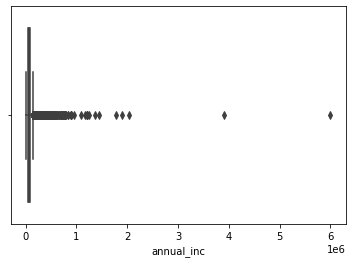

annual_inc -> (Lower Fence = 4000.0, Upper Fence = 145000.0)


In [82]:
upper_fence, lower_fence = upper_lower_fence(data_clean, 'annual_inc')

In [83]:
px.scatter(data_clean[
    data_clean['annual_inc'] < 145000.0 
]['annual_inc'].sort_values().unique())

In [84]:
data_clean[data_clean['annual_inc'] <= upper_fence]['annual_inc'].value_counts()

60000.00    1466
50000.00    1028
40000.00     855
45000.00     808
30000.00     806
            ... 
52518.72       1
42204.00       1
47232.00       1
9960.00        1
27376.00       1
Name: annual_inc, Length: 4814, dtype: int64

In [85]:
data_clean = data_clean[data_clean['annual_inc'] <= upper_fence]

### 2. int_rate ###
<b>`Defination`</b>
- **defination** -Interest Rate on the loan

<b>`Findings`</b>
- the outliers seem to have defaulted more as against the distribution of loan status hence should not be removed

In [86]:
col = 'int_rate'
column_meaning('int_rate')

'Interest Rate on the loan'

In [87]:
fig = px.box(data_clean, y=col)
fig.show()

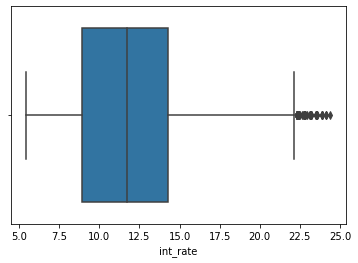

int_rate -> (Lower Fence = 5.42, Upper Fence = 22.265)


(22.265, 5.42)

In [88]:
upper_fence,lower_fence = upper_lower_fence(data_clean,col)
upper_fence,lower_fence


In [89]:
out = data_clean[(data_clean[col]>upper_fence)|(data_clean[col]<lower_fence)]

In [90]:
## percent distribution of loan_status for values lying outside fences
pd.pivot_table(out,index = 'loan_status',values = 'int_rate',aggfunc=lambda x:len(x)/out.shape[0]*100)

,int_rate
loan_status,
Charged Off,51.111111
Fully Paid,48.888889


In [91]:
data_clean['loan_status'].value_counts()/data_clean.shape[0]*100

Fully Paid     85.271318
Charged Off    14.728682
Name: loan_status, dtype: float64

### 3. inq_last_6mths ###
<b>`Defination`</b>
- *inq_last_6_month* :'The number of inquiries in past 6 months (excluding auto and mortgage inquiries)

<b>`Findings`</b>
- values lying beyond upper fence cant be treated as outlier as they indicate lower level of inquires made,dont seem as outlier

In [92]:
col = 'inq_last_6mths'
column_meaning(col)

'The number of inquiries in past 6 months (excluding auto and mortgage inquiries)'

In [93]:
fig = px.box(data_clean, y=col)
fig.show()

In [94]:
data_clean[col].value_counts()/data_clean.shape[0]*100

0    48.722970
1    27.659459
2    14.570923
3     7.613219
4     0.794234
5     0.364477
6     0.157759
7     0.087039
8     0.029920
Name: inq_last_6mths, dtype: float64

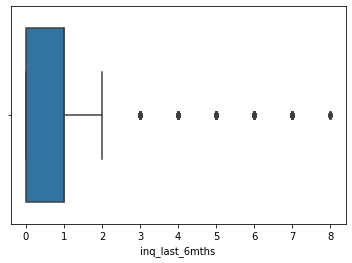

inq_last_6mths -> (Lower Fence = 0.0, Upper Fence = 2.5)


(2.5, 0.0)

In [95]:
upper_fence,lower_fence = upper_lower_fence(data_clean,col)
upper_fence,lower_fence

In [96]:
data_clean[(data_clean[col]>upper_fence)|(data_clean[col]<lower_fence)].shape

(3326, 31)

In [97]:
data_clean[(data_clean[col]<lower_fence)].shape

(0, 31)

### 4.open_acc ###
<b>`Defination`</b>

- ***open_acc*** -The number of open credit lines in the borrower's credit file

<b>`Findings`</b>
- values lying beyond upper fence cant be treated as outlier as they indicate greater number of open credit lines,cant be outliers 

In [98]:
col = 'open_acc'
column_meaning(col)

"The number of open credit lines in the borrower's credit file."

In [99]:
fig = px.box(data_clean, y=col)
fig.show()

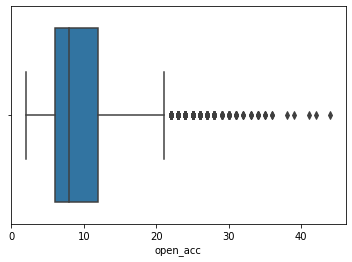

open_acc -> (Lower Fence = 2.0, Upper Fence = 21.0)


,open_acc
loan_status,
Charged Off,16.515837
Fully Paid,83.484163


In [100]:
### percent distribution of loan_status for values lying outside fences
upper_fence,lower_fence = upper_lower_fence(data_clean,col)
upper_fence,lower_fence
out = data_clean[(data_clean[col]>upper_fence)|(data_clean[col]<lower_fence)]
out.head()
pd.pivot_table(out,index = 'loan_status',values = 'open_acc',aggfunc=lambda x:len(x)/out.shape[0]*100)

### 5.pub_rec ###
<b>`Defination`</b>
- ***pub_rec***: Number of derogatory public records like bankrupties,court cases etc
- <b>derogatory public record</b> : A public record is information that literally anyone may obtain about you during a trip to the local courthouse. As such, derogatory public records usually consist of bankruptcy filings, civil court judgments, foreclosures and tax liens

<b>`Findings`</b>
-  this value will mostly be on the lower end for the general public hence most of the values are zeros,only  5% of the values have value greater than 0 and these values should not be treated as outlier

In [101]:
col = 'pub_rec'
column_meaning(col)

'Number of derogatory public records'

In [102]:
data_clean[col].value_counts()/data_clean.shape[0]*100

0    94.502924
1     5.350197
2     0.125119
3     0.016320
4     0.005440
Name: pub_rec, dtype: float64

In [103]:
fig = px.box(data_clean, y=col)
fig.show()

### 6.revol_bal ###

<b>`Defination`</b>
- *revol_bal*: Total credit revolving balance
- <b>revolving credit</b>: A revolving credit account sets a credit limit—a maximum amount you can spend on that account. You can choose either to pay off the balance in full at the end of each billing cycle or to carry over a balance from one month to the next, or "revolve" the balance.
- <b> revolving balance</b>: If you don’t pay the balance on your revolving credit account in full every month, the unpaid portion carries over to the next month. That’s called a revolving balance.

<b>`Findings`</b>
- values lying beyond upper fence should not be treated as outliers as they just indicate if a person has high revolving balance ie he trasfered paying his bill to another month

In [104]:
col = 'revol_bal'
column_meaning(col)

'Total credit revolving balance'

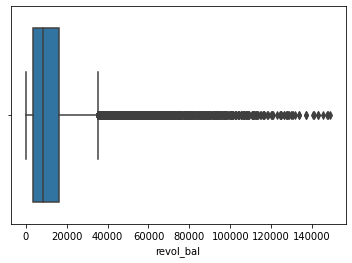

revol_bal -> (Lower Fence = 0.0, Upper Fence = 35189.5)


,revol_bal
loan_status,
Charged Off,14.805548
Fully Paid,85.194452


In [105]:
### percent distribution of loan_status for values lying outside fences
upper_fence,lower_fence = upper_lower_fence(data_clean,col)
upper_fence,lower_fence
out = data_clean[(data_clean[col]>upper_fence)|(data_clean[col]<lower_fence)]
out.head()
out = data_clean[(data_clean[col]>=data_clean[col].describe()['25%'])&(data_clean[col]<=data_clean[col].describe()['75%'])]
pd.pivot_table(out,index = 'loan_status',values = col,aggfunc=lambda x:len(x)/out.shape[0]*100)

In [106]:
fig = px.box(data_clean, y=col)
fig.show()

In [107]:
data_clean[col].describe()

count     36765.000000
mean      12384.505127
std       13858.889013
min           0.000000
25%        3582.000000
50%        8535.000000
75%       16225.000000
max      149000.000000
Name: revol_bal, dtype: float64

In [108]:
data_clean.isna().sum()

loan_amnt                          0
term                               0
int_rate                           0
installment                        0
grade                              0
sub_grade                          0
emp_length                         0
home_ownership                     0
annual_inc                         0
verification_status                0
issue_d                            0
loan_status                        0
purpose                            0
zip_code                           0
addr_state                         0
dti                                0
earliest_cr_line                   0
inq_last_6mths                     0
open_acc                           0
pub_rec                            0
revol_bal                          0
revol_util                         0
total_acc                          0
pub_rec_bankruptcies               0
grade_sublevel_number              0
issue_d_month                      0
issue_d_year                       0
l


## Binning the loan amount column - Continuous numeric variable
**----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

### 1.loan_amnt

In [109]:
px.scatter(data_clean['loan_amnt'].sort_values().unique())

In [110]:
data_clean['loan_amnt_range'] = pd.cut(
    data_clean['loan_amnt'],
    [0, 5000, 10000, 15000, 20000, 25000, 30000, 35000],
    labels=[
        '0-5000',
        '5001-10000',
        '10001-15000',
        '15001-20000',
        '20001-25000',
        '25001-30000',
        '30001-35000', 
    ]
)

### 2.int rate ###

In [111]:
px.scatter(data_clean['int_rate'].sort_values().unique())

In [112]:
data_clean['int_rate_range'] = pd.cut(data_clean['int_rate'],[0, 10, 15, 20, 25],
    labels=[
        '0-10',
        '11-15',
        '16-20',
        '21-25',
    ],
)

### 3. annual_inc

In [113]:
bins = [0, 25000, 50000, 75000, 100000, 20000000]
ranges = ['0-25000', '25000-50000', '50000-75000', '75000-100000', '100000+']
data_clean['annual_inc_range'] = pd.cut(data_clean['annual_inc'], bins, labels=ranges)

### 4.dti_range ###

In [114]:
px.scatter(data_clean['dti'].sort_values().unique())

In [115]:
bins = [-0.1, 5.00, 10.00, 15.00, 20.00, 25.00, 30.00]
ranges = ['0-5%', '5-10%', '10-15%', '15-20%', '20-25%', '25%+']
data_clean['dti_range'] = pd.cut(data_clean['dti'], bins, labels=ranges)


### 5.installment ###

In [116]:
px.scatter(data_clean['installment'].sort_values().unique())

In [117]:
bins = [0,200,400,600,800,1000,2000]
ranges = ['0-200','200-400','400-600','600-800','800-1000','1000+']
data_clean['installment_ranges'] = pd.cut(data_clean['installment'],bins,labels = ranges)

### 6. earlist_credit_line

In [118]:
bins = [1940,1950,1970,1980,1985,1990,1995,2000,2005,2010,2020]
ranges = ['before 1950','1950-1970','1970-1980','1980-1985','1985-1990','1990-1995','1995-2000','2000-2005','2005-2010','2010 onwards']
data_clean['earlist_credit_line_year_ranges'] = pd.cut(data_clean['earliest_cr_line_year'],bins,labels = ranges)

### 7. loan_income_ratio

In [119]:
data_clean['loan_income_ratio_range'] = pd.cut(
    data_clean['loan_income_ratio'],
    [0, 5, 10, 15, 20, 25, 30, 35,40,45,100],
    labels=[
        '0-5',
        '5-10',
        '10-15',
        '15-20',
        '20-25',
        '25-30',
        '30-35',
        '35-40',
        '40-45',
        '45+'
    ]
)

# Analysis - Univariate
**----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

### 1. loan_amnt
<b>`Defination`</b>

- *loan_amnt*: The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

<b>`Findings`</b>
- Data distribution of loan suggests its **Right Skewed**
- Most of the loan amount lies between 5000 - 15000, 75% of loan amount lie below 15000


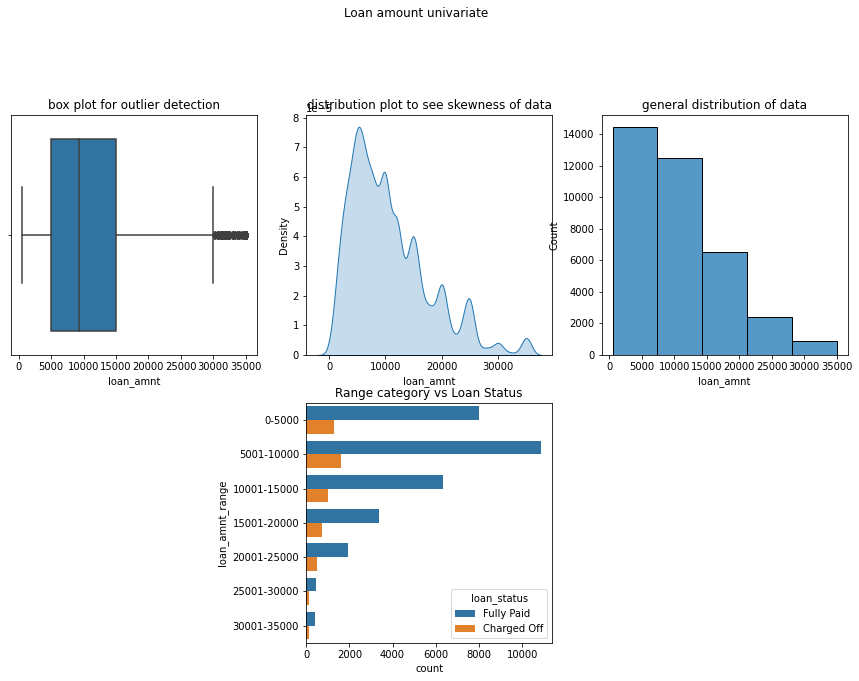

skew:  1.0946791485209844


In [120]:
continuous_variable_graphs(data_clean, 'loan_amnt', title='Loan amount univariate')

In [121]:
univariate(data_clean, 'loan_amnt_range', title='Loan bins amount univariate')

In [122]:
# data_clean.loan_amnt_range.count().sort_values(ascending=False).plot(kind='line', logy=True, marker='o', color='b')

In [123]:
# data_clean.groupby('grade').loan_amnt.count().sort_values(ascending=False).plot(kind='line', logy=True, marker='o', color='b')


In [124]:
# data_clean.emp_length.value_counts().sort_values(ascending = False).plot(kind = "line",logy = True,marker = '*',color = 'r')

Power law

In [125]:
# #Let's see if some of these variables follow the famous power law.
# plt.figure(figsize=(15,5))
# plt.subplot(1, 3, 1)
# master_loan.groupby('grade').loan_amnt.count().sort_values(ascending=False).plot(kind='line', logy=True, marker='o', color='b')
# plt.subplot(1, 3, 2)
# master_loan.groupby('purpose').loan_amnt.count().sort_values(ascending=False).plot(kind='line', logy=True, marker='o', color='b')
# plt.subplot(1, 3, 3)
# master_loan.groupby('verification_status').loan_amnt.count().sort_values(ascending=False).plot(kind='line', logy=True, marker='o', color='b')
# plt.tight_layout()

### 2. verification_status
<b>`Defination`</b>
- *verification_status*:  Indicates if income was verified by LC, not verified, or if the income source was verified

<b>`Findings`</b>
- verification can be of two types- external verfifcation or verification by LC
- verified by LC = 30.7%
- verified source were 25%
- not verified = 44.3%



In [126]:
fig = px.pie(data_clean, names='verification_status', title='Distribution of verification status in dataset')
fig.show()

### 3.int rate
<b>`Defination`</b>
- *int_rate*: rate at which intrest is provided

<b>`Findings`</b>
- 75% of loans have intrest rate lower than 14.27
- 47% of loans have intrest rate between 11-15, followed by 32% for loans with intrest rate between 0-10%
- only 1.83% loan application had high intrest rate lying between 21-25%



In [127]:
px.box(data_clean, y='int_rate')
fig.show()

In [128]:
fig = px.pie(data_clean, names='int_rate_range', title='Distribution of verification status in dataset')
fig.show()

### 4. grade
<b>`Defination`</b>
- *grade* - loan grade assigned by Lending Club

<b>`Findings`</b>
-  Most loans are provided to Grade B-(30.3%), 
-  very few loans have Grade G-(0.72%)




In [129]:
univariate(data_clean, 'grade', 'Grade distribution')

In [130]:
(data_clean['grade'].value_counts()/data_clean.shape[0]*100).to_frame()

,grade
B,30.330477
A,26.337549
C,20.378077
D,13.167415
E,6.661227
F,2.404461
G,0.720794


### 5. emp_length
<b>`Defination`</b>
- *emp_length*: employement length of the loan requester\

<b>`Findings`</b>
- Most loan applicants have 10+ year of experience
- top two categories for loan applicant are-
    - 10+ year of experience -21%
    - less than 1 year expereince- 11%
- For Around 2.75% employee employement length is not available




In [131]:
univariate(data_clean,'emp_length', 'emp len distribution')

In [132]:
(data_clean['emp_length'].value_counts()/data_clean.shape[0]*100).to_frame()

,emp_length
10+ years,21.572147
< 1 year,11.799266
2 years,11.184551
3 years,10.436557
4 years,8.722970
5 years,8.301374
1 year,8.295934
6 years,5.652115
7 years,4.471644
8 years,3.661091


### 6. home_ownership
<b>`Defination`</b>
- *home_ownership*: The home ownership status provided by the borrower during registration. Our values are: 
    - RENT
    - OWN
    - MORTGAGE
    - OTHER.
    
<b>`Findings`</b>
- only 7% people who applied for loans have their own house
- Most loan applicants have either house on mortgage(49%) or live on rent(42%)


In [133]:
fig = px.pie(data_clean, names='home_ownership', title='Distribution of verification status in dataset')
fig.show()

## 7. annual_inc and annual_inc_range
<b>`Defination`</b>
- *annual_inc* : The self-reported annual income provided by the borrower during registration.
- *annual_inc_range* :different bucket of annual income

<b>`Findings`</b>
- 75% of data have annual income less than 135000
- around 50 percent of the data is concentrated between 40000 to 78000
- around 6% of loan requester have annual income between 0-25000




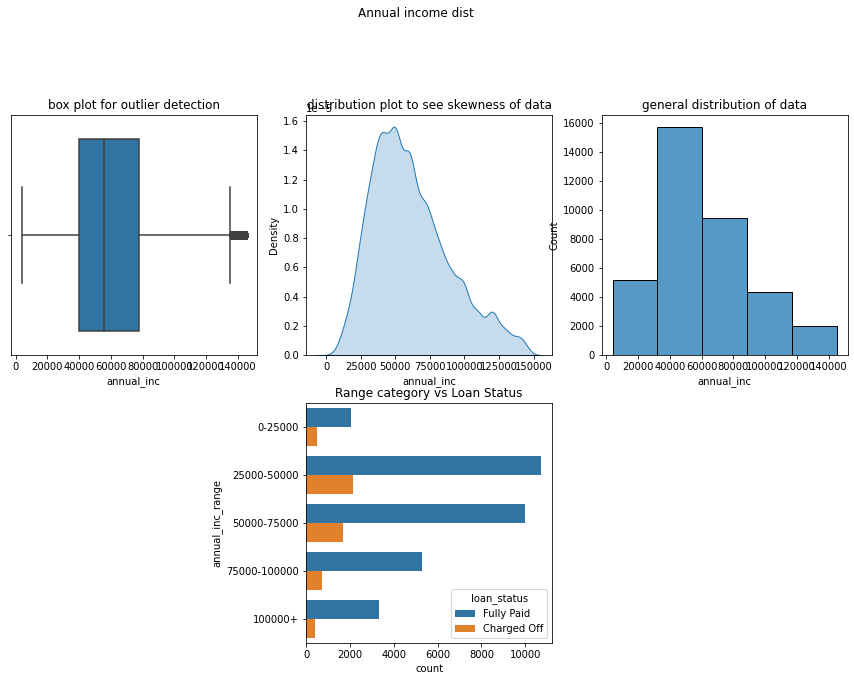

skew:  0.7100725983300461


In [134]:
continuous_variable_graphs(data_clean, 'annual_inc', 'Annual income dist')

In [135]:
univariate(data_clean, 'annual_inc_range', title='Annual income bins amount univariate')

## 8. issue_d_year and issue_d_month

<b>`Defination`</b>
- *issue_d*: date when the loan was issued, ***we can treat this as rather when the loan was applied in some way as we donot have that information***
- *issue_d_year* : Year when the loan was issued
- *issue_d_month*: month of issue damoste

<b>`Findings`</b>
- **loan_year**
    - the loan data present if for years 2007-2011
    - most loans were issued in 2011
    - loans issued in 2007 were very few, it might be related to global finanical crisis in 2007
    <a>https://en.wikipedia.org/wiki/Subprime_mortgage_crisis</a>
- **loan_month**
    - most loans are provided in the month of december
    - loans issue/requested increase as we go through the year
    - Lending Club is a US based firm and in US tx cycle is from 1st jan to 31st dec every year so this can be a reason why most loans are requested in dec

In [136]:
univariate(data_clean,'issue_d_year',"Yearly loan funded accross months")

In [137]:
univariate(data_clean,'issue_d_month',"loan funded accross months")

### 9. purpose
<b>`Defination`</b>
- *purpose* - reason behind loan application

<b>`Findings`</b>
- around 47% loans requested are for debt consolidation
- least loans requested are for renewable energy which stand around 2%


In [138]:
univariate(data_clean, 'purpose', 'purpose dist')

In [139]:
fig = px.pie(data_clean, names='purpose', title='Distribution of verification status in dataset')
fig.show()

### 10. addr_state
<b>`Defination`</b>
- *defination*: state code for dfferent states from which the borrower belongs

<b>`Findings`</b>
- top 5 states requesting loans are:
    - CA(california) - 17%
    - NY(new York) - 9%
    - FL(Florida) - 7%
    - TX(Texas) -6%
    - NJ(New Jersey) - 4%


In [140]:
univariate(data_clean, 'addr_state', 'addr_state dist')

### 11. dti and dti_range

<b>`Defination`</b>
- *dti* - monthly debt to montly income ratio
- *dti_range* - buckets for dti

<b>`Findings`</b>
- dti seem to follow a uniform distribution, **indicated by skew of -0.05**
- 75% of the dti data lies below 18%
- 16% data points have dti greater than 25%



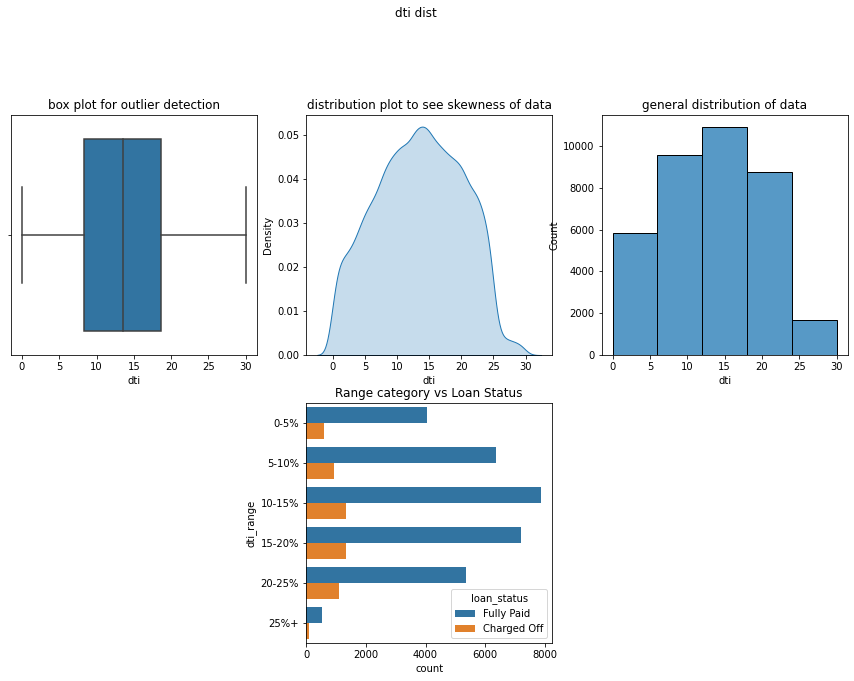

skew:  -0.0513751659187308


In [141]:
continuous_variable_graphs(data_clean, 'dti', 'dti dist')

In [142]:
univariate(data_clean, 'dti_range', 'dti_range bins dist')

### 12. inq_last_6months
<b>`Defination`</b>
- *inq_last_6months* : The number of inquiries in past 6 months (excluding auto and mortgage inquiries)

<b>`Findings`</b>
- inq_last_6_months seeem to follow power law distribution
- around 48% data points made 0 enquires



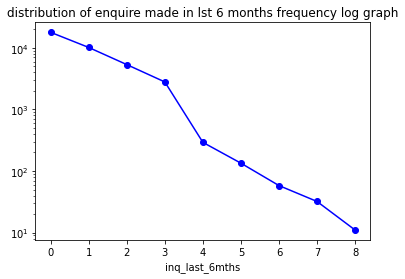

In [143]:
data_clean.inq_last_6mths.value_counts().plot(kind='line', logy=True, marker='o', color='b')
plt.title("distribution of enquire made in lst 6 months frequency log graph")
plt.xlabel("inq_last_6mths")
plt.show()


In [144]:
fig = px.pie(data_clean, names='inq_last_6mths', title='Distribution of verification status in dataset')
fig.show()

In [145]:
log_normal_univariate(data_clean, 'inq_last_6mths', 'inq_last_6mths dist')

### 13. open_acc
<b>`Defination`</b>
- ***open_acc*** -The number of open credit lines in the borrower's credit file 

<b>`Findings`</b>
- distribution plot suggests the data is **right skewed** ie it tends to be on the lower side
- 75% of the data lies below 12 open credit lines

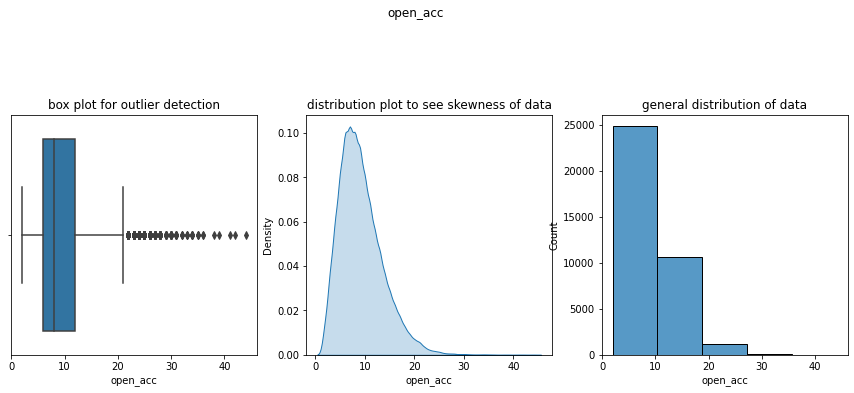

skew:  1.0187216683052183


In [146]:
continuous_variable_graphs(data_clean, 'open_acc', 'open_acc')

### 14. pub_rec
<b>`Defination`</b>

- ***pub_rec***: Number of derogatory public records like bankrupties,court cases etc
- <b>derogatory public record</b> : A public record is information that literally anyone may obtain about you during a trip to the local courthouse. As such, derogatory public records usually consist of bankruptcy filings, civil court judgments, foreclosures and tax liens

<b>`Findings`</b>
- almost 95% of loan applicants donot contain any public derogatory comments

In [147]:
log_normal_univariate(data_clean, 'pub_rec', 'pub_rec dist')

### 15. installment
<b>`Defination`</b>
- *instalment*: monthly installment for loan

<b>`Findings`</b>
- majority of the loans have installemnent on the lower end between 150 to 430 which is also indicated by its **right skewedness**


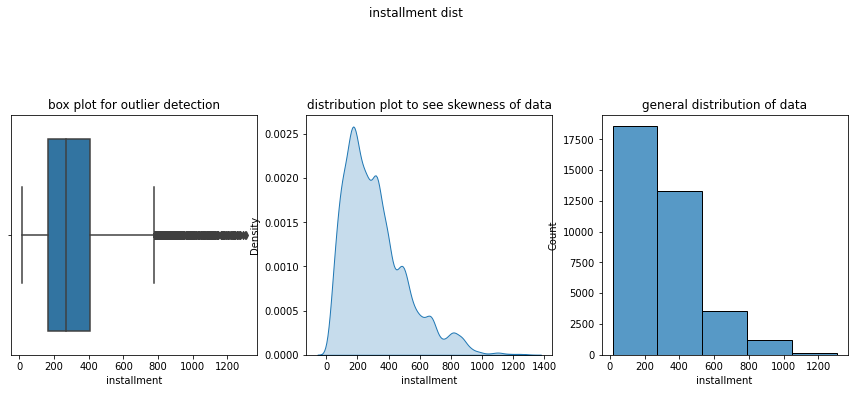

skew:  1.1425231338741706


In [148]:
continuous_variable_graphs(data_clean, 'installment', 'installment dist')

In [149]:
univariate(data_clean, 'installment_ranges', 'installment bins dist')

### 16. revol_bal
<b>`Defination`</b>
- *revol_bal*: Total credit revolving balance
- <b>revolving credit</b>: A revolving credit account sets a credit limit—a maximum amount you can spend on that account. You can choose either to pay off the balance in full at the end of each billing cycle or to carry over a balance from one month to the next, or "revolve" the balance.
- <b> revolving balance</b>: If you don’t pay the balance on your revolving credit account in full every month, the unpaid portion carries over to the next month. That’s called a revolving balance.

<b>`Findings`</b>
-  this is **heavily right skewed** , its skewness value stands at 2.995
- revolving balance tends to be between 0 to 23k


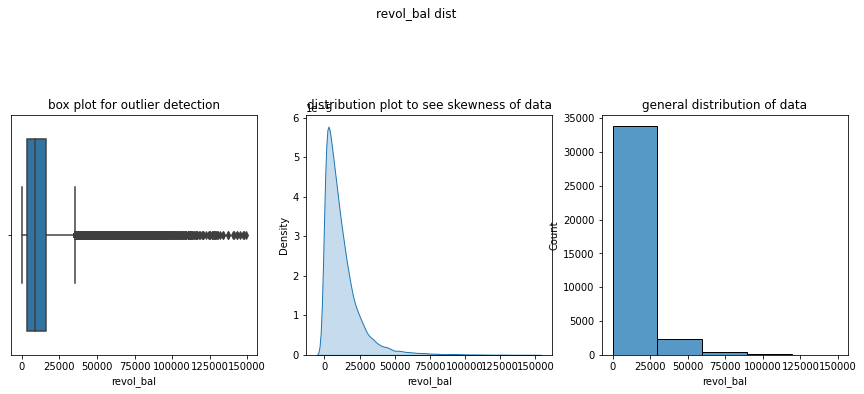

skew:  2.9955176993081074


In [150]:
continuous_variable_graphs(data_clean, 'revol_bal', 'revol_bal dist')

### 17. revol_util
<b>`Defination`</b>
- *revol_util* - Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.

<b>`Findings`</b>
- it follows a uniform distribution and its skewness stands at -0.02
- 75% values are below 72%


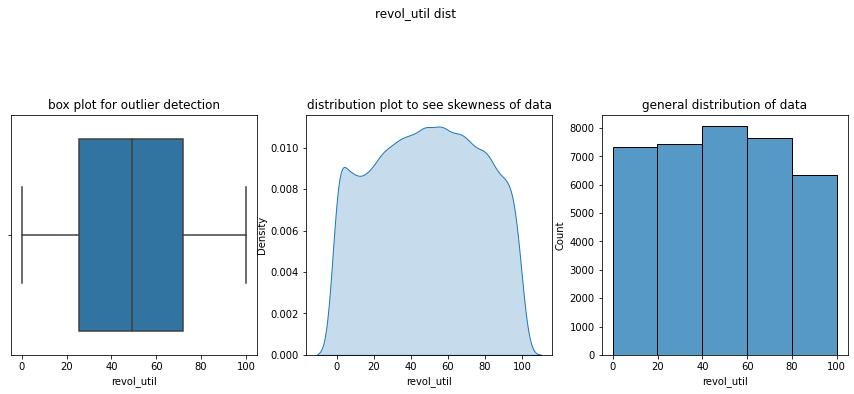

skew:  -0.024353853177917984


In [151]:
continuous_variable_graphs(data_clean, 'revol_util', 'revol_util dist')

### 18. total_acc
<b>`Defination`</b>
- `total_acc`: The total number of credit lines currently in the borrower's credit file

<b>`Findings`</b>
- the data is right skewed ie it tends to be on the lower end
- 75% of the total_Acc lie below 28 accounts

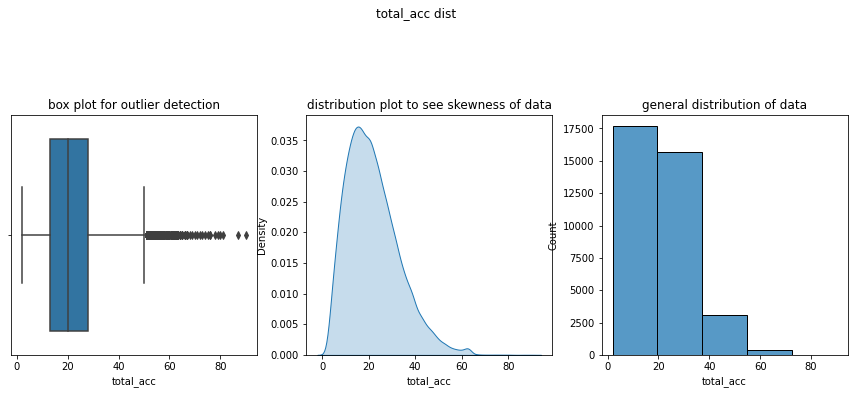

skew:  0.851129788321672


In [152]:
continuous_variable_graphs(data_clean, 'total_acc', 'total_acc dist')

### 19. pub_rec_bankruptcies
<b>`Defination`</b>
- *pub_rec_bankrupties*: :Number of public record bankruptcies

<b>`Findings`</b>
- 95% of the loan applicants didnit have any public recorded bankrupties



In [153]:
log_normal_univariate(data_clean, 'pub_rec_bankruptcies', 'pub_rec_bankruptcies dist')

In [154]:
data_clean[data_clean['pub_rec']!=data_clean['pub_rec_bankruptcies']][['pub_rec_bankruptcies','pub_rec']]

,pub_rec_bankruptcies,pub_rec
94,0.0,1
253,0.0,1
587,0.0,1
600,0.0,1
767,0.0,1
...,...,...
39509,0.0,2
39515,0.0,1
39560,0.0,1
39601,0.0,1


### 20. loan_income_ratio
<b>`Defination`</b>
- *loan_income_ratio*: ratio between loan amount and annnual income of the borrower

<b>`Findings`</b>
- 75% of the ratio lies below 25


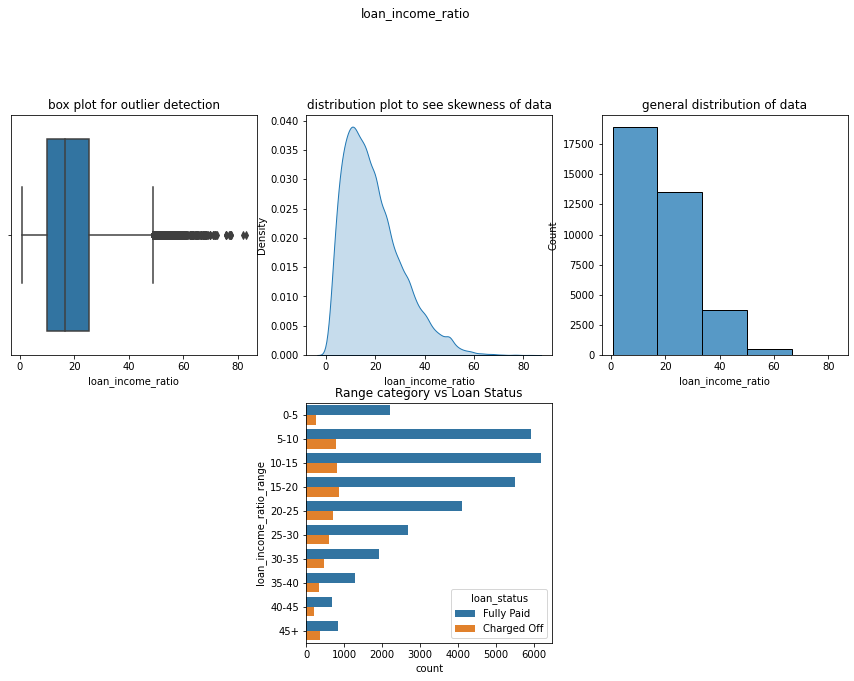

skew:  0.9539044515878474


In [155]:
continuous_variable_graphs(data_clean, 'loan_income_ratio', 'loan_income_ratio')

In [156]:
data_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,grade_sublevel_number,issue_d_month,issue_d_year,loan_income_ratio,open_to_total_credit_line_ratio,earliest_cr_line_month,earliest_cr_line_year,loan_amnt_range,int_rate_range,annual_inc_range,dti_range,installment_ranges,earlist_credit_line_year_ranges,loan_income_ratio_range
0,5000,36 months,10.65,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860xx,AZ,27.65,Jan-85,1,3,0,13648,83.7,9,0.0,2,Dec,2011,20.83,33.333333,Jan,1985,0-5000,11-15,0-25000,25%+,0-200,1980-1985,20-25
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309xx,GA,1.00,Apr-99,5,3,0,1687,9.4,4,0.0,4,Dec,2011,8.33,75.000000,Apr,1999,0-5000,16-20,25000-50000,0-5%,0-200,1995-2000,5-10
2,2400,36 months,15.96,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606xx,IL,8.72,Nov-01,2,2,0,2956,98.5,10,0.0,5,Dec,2011,19.59,20.000000,Nov,2001,0-5000,16-20,0-25000,5-10%,0-200,2000-2005,15-20
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917xx,CA,20.00,Feb-96,1,10,0,5598,21.0,37,0.0,1,Dec,2011,20.33,27.027027,Feb,1996,5001-10000,11-15,25000-50000,15-20%,200-400,1995-2000,20-25
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,wedding,852xx,AZ,11.20,Nov-04,3,9,0,7963,28.3,12,0.0,4,Dec,2011,13.89,75.000000,Nov,2004,0-5000,0-10,25000-50000,10-15%,0-200,2000-2005,10-15


# BIVARIATE Analysis
**----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

### 1. loan_income_ratio vs loan_status
<b>`Findings`</b>
- loan_income ratio tends to be higher for loan defaulters
- around 30% tend to deafult when loan_income_ratio is 45+
- A linear relationship is seen between loan_income_Ratio and loan_status,<b> `higher the ratio higher are the chances for default`</b>


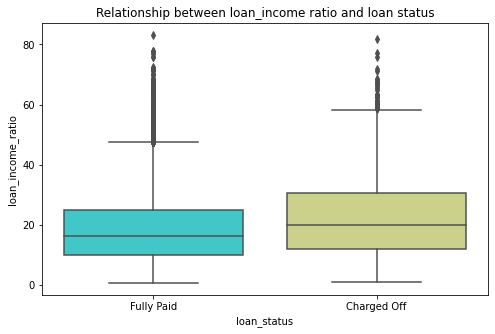

In [157]:
col = 'loan_income_ratio'
plt.figure(figsize=(8,5))
sns.boxplot(y=col,data=data_clean,x = 'loan_status', palette='rainbow')
plt.title("Relationship between loan_income ratio and loan status")
plt.show()

In [158]:
temp = pd.crosstab(data_clean['loan_income_ratio_range'],data_clean['loan_status']) 
temp

loan_status,Charged Off,Fully Paid
loan_income_ratio_range,,
0-5,272,2212
5-10,792,5928
10-15,802,6182
15-20,858,5496
20-25,699,4100
25-30,607,2693
30-35,474,1928
35-40,335,1290
40-45,220,686


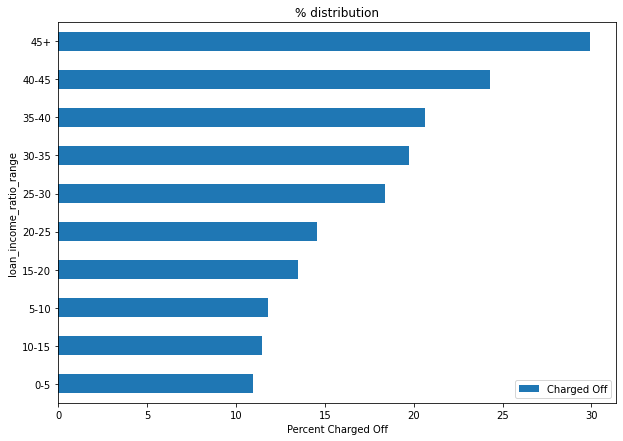

In [159]:
bi_analysis(temp, title = "% distribution")

## 2.term vs loan_status

<b>`Findings`</b>
- Most of the loans that were fully paid opted a term of 36 months,(79% of all fully paid loans)
- Defaulter loans donot not follow this trend,here 43% are 60 month term and 57% were 36 month term
- `Defaulter loans tend to have a term of 60 months more than those loans which didnot default`

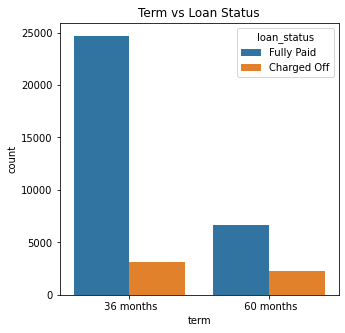

In [160]:
plt.figure(figsize=(5, 5))
ax = sns.countplot(
    data=data_clean,
    x="term", 
    hue='loan_status'
)
ax.set_title('Term vs Loan Status')
plt.show()

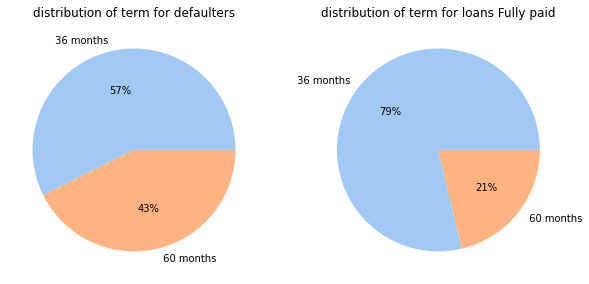

In [161]:
#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]

#create pie chart

fig, ax = plt.subplots(ncols = 2,nrows=1,figsize = (10,10))


ax[0].pie(data_clean[data_clean['loan_status']=='Charged Off']['term'].value_counts(), labels = data_clean[data_clean['loan_status']=='Charged Off']['term'].value_counts().index, colors = colors, autopct='%.0f%%')
ax[0].set_title("distribution of term for defaulters")
ax[1].pie(data_clean[data_clean['loan_status']=='Fully Paid']['term'].value_counts(), labels = data_clean[data_clean['loan_status']=='Fully Paid']['term'].value_counts().index, colors = colors, autopct='%.0f%%')
ax[1].set_title("distribution of term for loans Fully paid")

plt.show()


### 3.grade_sublevel_number vs loan_status
<b>`Defination`</b>
- ***sub_gradelevel_number***: the subgrade number it belongs to, the subgrade column contains values like A1,B5,D4  etc, this columns contains the number component subgrade

<b>`Findings`</b>

- no direct relationship is seen between grade sublevel number and loan status

In [162]:
ot = pd.pivot_table(
    data_clean,
    columns = 'grade_sublevel_number',
    index = 'loan_status',
    values = 'grade',
    aggfunc=lambda x:x.shape[0]
)
ot

grade_sublevel_number,1,2,3,4,5
loan_status,,,,,
Charged Off,981,1105,1117,1084,1128
Fully Paid,5737,6177,6467,6623,6346


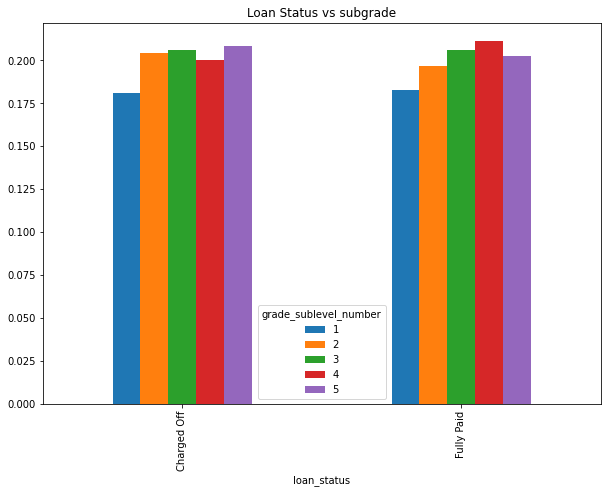

In [163]:
ot[
    list(ot.columns)
].apply(
    lambda x: x / x.sum(),
    axis=1
).plot(
    kind = "bar",
    figsize = (10,7),
    title = 'Loan Status vs subgrade'
)
plt.show()

### 4.sub_grade vs loan status

<b>`Findings`</b>
- top 5 subgrades that defaulted are:
    - F5    52 %
    - G3    46.3 %
    - G5    39.1 %
    - G2    36.7 %
    - G1    34%

In [164]:
temp = pd.crosstab(data_clean['sub_grade'],data_clean['loan_status'])
temp.head()

loan_status,Charged Off,Fully Paid
sub_grade,,
A1,30,1068
A2,74,1383
A3,103,1651
A4,173,2586
A5,213,2402


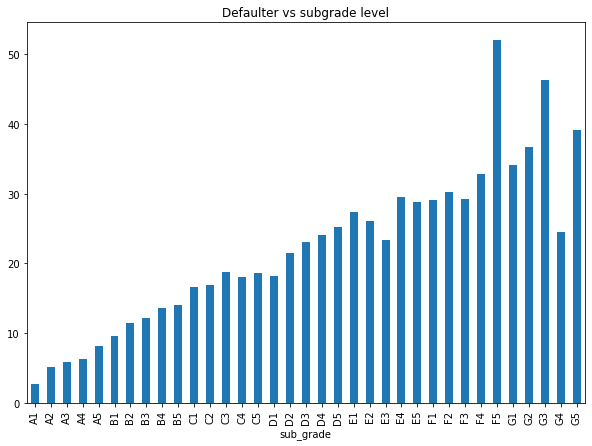

In [165]:
temp[
    list(temp.columns)
].apply(
    lambda x:x/x.sum()*100,
    axis=1
)[
    'Charged Off'
 ].plot(
    kind = "bar",
    figsize = (10,7),
    stacked = True,
    title= "Defaulter vs subgrade level"
)
plt.show()

### 5. annual_income_range vs loan_ status
- we have divided annual income into 5 baskets- **['0-25000', '25000-50000', '75000-100000', '50000-75000', '100000+']**

<b>`Findings`</b>
- Charged off is directly **inversly related to annual inc**, 
- `we see an upward trend ,ie when the annual income increases the percent of loan default decreases`
- loans which are fully paid donot show this behaviour


In [166]:
temp = pd.crosstab(
    data_clean['annual_inc_range'],
    data_clean['loan_status']
) 

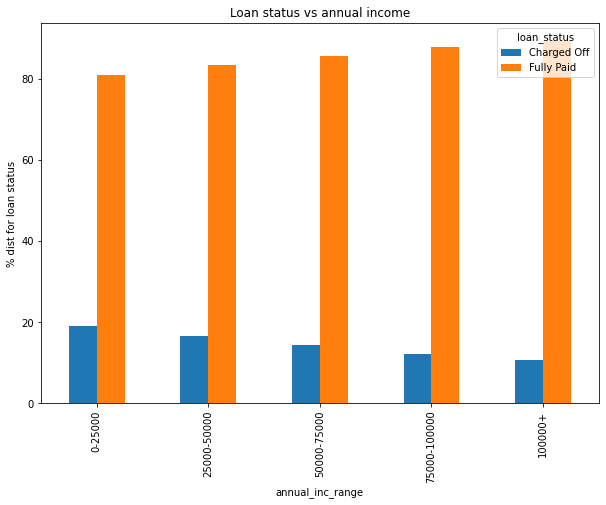

In [167]:
temp[
    list(temp.columns)
].apply(
    lambda x: x / x.sum() * 100,
    axis=1
).plot(
    kind = "bar",
    figsize = (10,7),
    title ='Loan status vs annual income',
)
plt.ylabel('% dist for loan status')
plt.show()

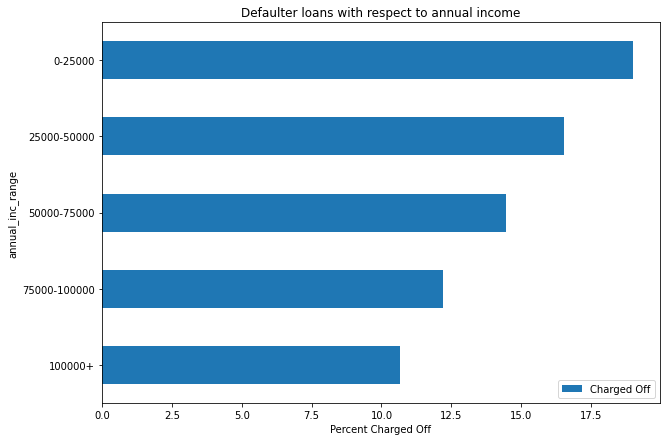

In [168]:
bi_analysis(temp,'Defaulter loans with respect to annual income')

### 6. Purpose vs loan status
<b>`Findings`</b>
- **Debt consolidation** has highest number of loan applications
- top 5 categories where loan was defaulted are:
    - small business 26%
    - renewable energy 17%
    - educational 16%
    - medical 15%
    - others 15%
- <b>`loans for small business are 26% charged off hence they are most risky loans`</b>

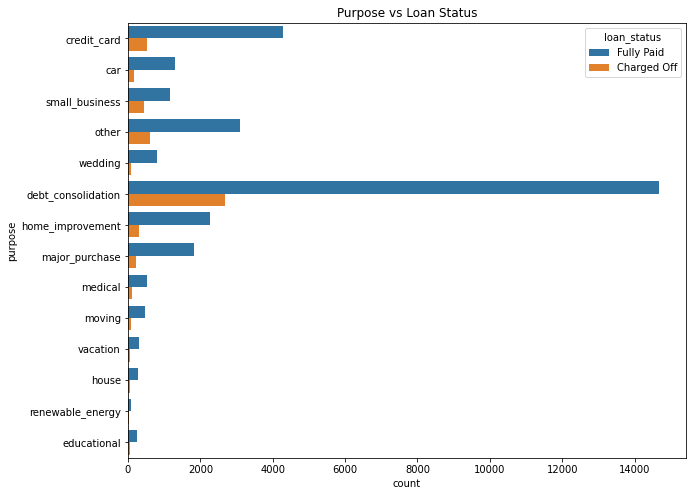

In [169]:
plt.figure(figsize=(10, 8))
ax = sns.countplot(data=data_clean,y="purpose", hue='loan_status')
ax.set_title('Purpose vs Loan Status')
plt.show()

In [170]:
temp = pd.crosstab(data_clean['purpose'],data_clean['loan_status']) 
temp

loan_status,Charged Off,Fully Paid
purpose,,
car,158,1296
credit_card,521,4280
debt_consolidation,2679,14686
educational,54,256
home_improvement,319,2260
house,55,283
major_purchase,216,1833
medical,103,537
moving,90,458


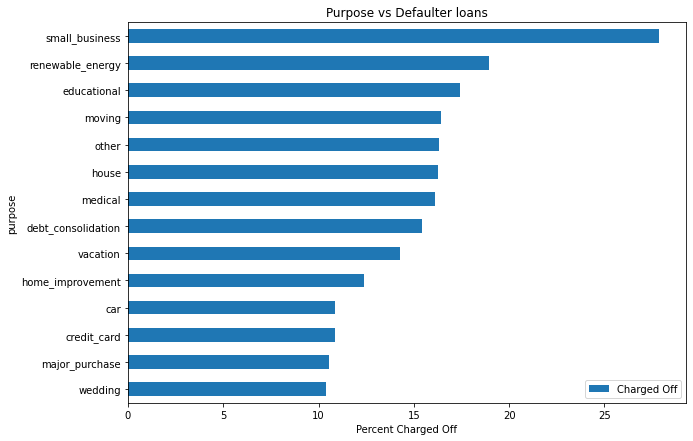

In [171]:
bi_analysis(temp, title="Purpose vs Defaulter loans")

### 7. grade vs loan_status ###
<b>`Findings`</b>
- Grade is inversly related with loan status
- <b> `A - G if considered alphabetical order as the order increasese so does the loan default percent`</b>

- `loans for Grade -G are 35% charged off hence they are most risky loans`
- `loans for Grade -A are 6% charged off hence they are most safe loans`
- Grade G has highest median loan requested



In [172]:
temp = pd.crosstab(data_clean['grade'], data_clean['loan_status'])
temp.apply(lambda x:x/x.sum()*100,axis  = 1)

loan_status,Charged Off,Fully Paid
grade,,
A,6.124135,93.875865
B,12.375572,87.624428
C,17.645489,82.354511
D,22.309440,77.690560
E,26.868109,73.131891
F,32.579186,67.420814
G,35.471698,64.528302


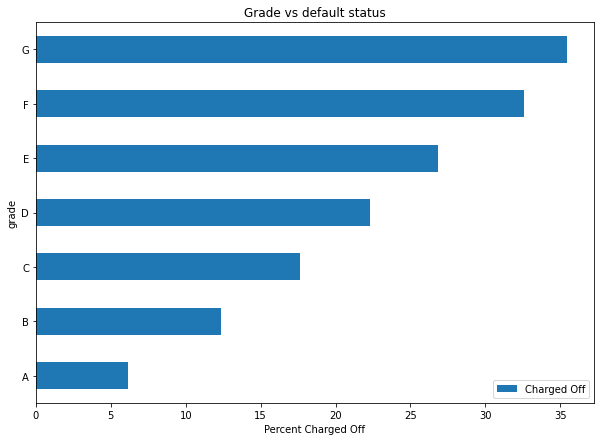

In [173]:
bi_analysis(temp, "Grade vs default status",fig = (10,7))

### 7(a) grade vs loan_amount ###


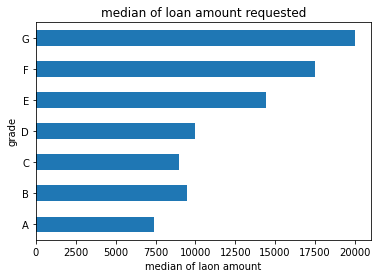

In [174]:
data_clean.groupby('grade')['loan_amnt'].median().plot.barh(title = "median of loan amount requested")
plt.xlabel("median of laon amount")
plt.show()



#### PLot for Grade vs subgrade for loan defaults( TRIVARIATE??)

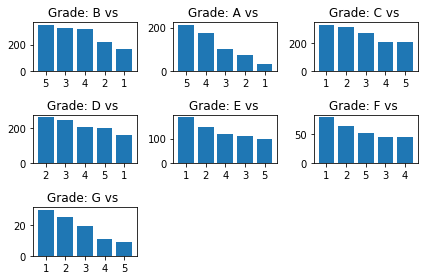

In [175]:

row = 3
col = 3
for i,grade in enumerate(data_clean['grade'].value_counts().index):
    plt.subplot(row, col, i+1)
    column_name=  'grade_sublevel_number'
    temp = data_clean[(data_clean['grade']==grade)&(data_clean['loan_status']=='Charged Off')]
    tempdf = pd.DataFrame({'category':temp[column_name].value_counts().index,'count':temp[column_name].value_counts()})
    p = plt.bar(data = tempdf,x = 'category',height = 'count')
    plt.title(f'Grade: {grade} vs ')
plt.tight_layout()

plt.show()

    

### 8.intrest rate vs loan_status ###
<b>`Findings`</b>

- Charged off loans share linear relationship with intrest rate
- *** intrest rate increase so does the charge off rate ***

-<b>`most Charged off loans had intrest rate between 20-25%`</b>

In [176]:
temp = pd.crosstab(data_clean['int_rate_range'],data_clean['loan_status'])
temp.apply(lambda x:x/x.sum()*100,axis  = 1)

loan_status,Charged Off,Fully Paid
int_rate_range,,
0-10,6.843081,93.156919
11-15,15.105809,84.894191
16-20,25.058962,74.941038
21-25,39.675516,60.324484


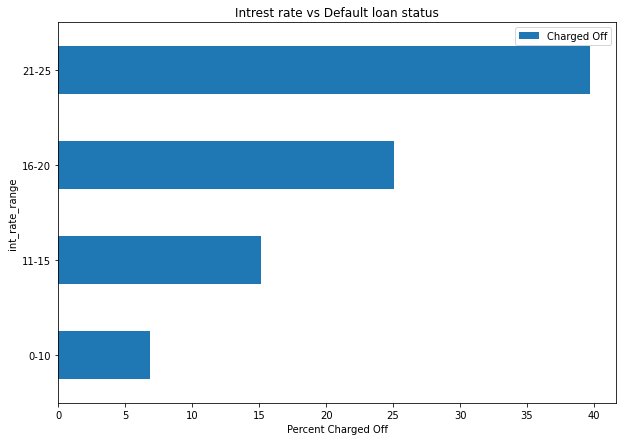

In [177]:
bi_analysis(temp, title="Intrest rate vs Default loan status")

### 9.Dti range vs loan_status ###
<b>`Defination`</b>
-Ratio of monthly debt payemnt against his total monthly income

<b>`Findings`</b>

- dti values between 0-25 seem to have a direct reationship 
- `with loan status more the dti more chances of defaulting between *** 0-25 dti ***`
- dti values above 25% donot follow this trend

In [178]:
temp = pd.crosstab(data_clean['dti_range'],data_clean['loan_status'])
temp.apply(lambda x:x/x.sum()*100,axis = 1)


loan_status,Charged Off,Fully Paid
dti_range,,
0-5%,12.667242,87.332758
5-10%,12.950528,87.049472
10-15%,14.656671,85.343329
15-20%,15.748216,84.251784
20-25%,17.027529,82.972471
25%+,14.100486,85.899514


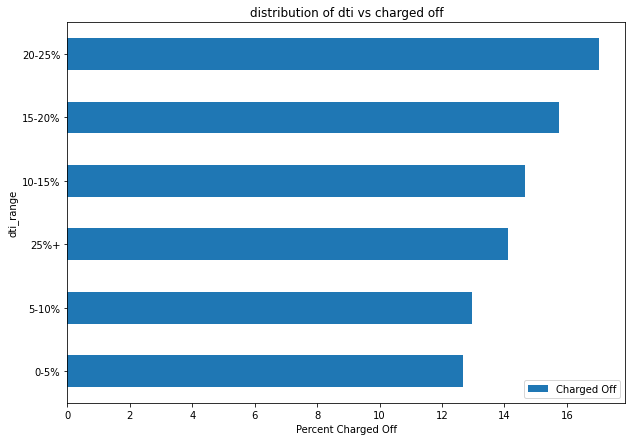

In [179]:
bi_analysis(temp,"distribution of dti vs charged off")

###  10.emp_length vs loan ###

<b>`Findings`</b>
- loan deafult was highest for uknown category followed by 10+ year employment
- <b>`Most loan defaults were in case where employment length was not present`</b>


In [180]:
temp = pd.crosstab(
    data_clean['emp_length'],
    data_clean['loan_status']
)
temp.apply(lambda x:x/x.sum()*100,axis = 1)

loan_status,Charged Off,Fully Paid
emp_length,,
1 year,14.655738,85.344262
10+ years,16.076157,83.923843
2 years,13.302529,86.697471
3 years,13.995309,86.004691
4 years,13.782351,86.217649
5 years,14.416776,85.583224
6 years,14.196343,85.803657
7 years,15.328467,84.671533
8 years,14.338782,85.661218


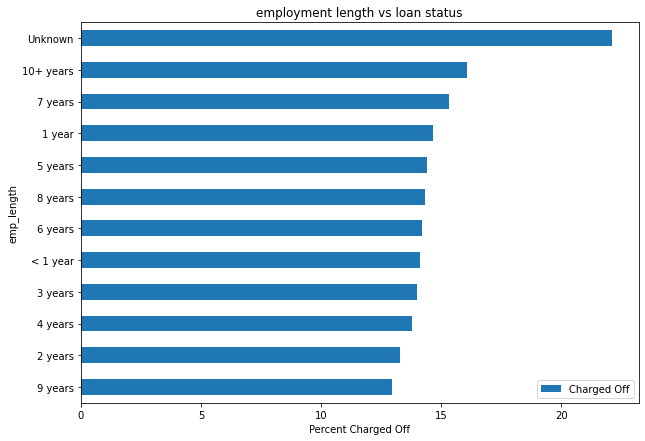

In [181]:
bi_analysis(temp,"employment length vs loan status")

### 11.loan_amnt_range vs loan status ###

<b>`Findings`</b>
- Higher loan amount tend to default more than lower loan amount
- <b>`Charged off percent is as high as 28% in case of loan amount lying between 30-25k making them risky loans`</b>



In [182]:
temp = pd.crosstab(data_clean['loan_amnt_range'],data_clean['loan_status'])
temp
temp = temp.apply(lambda x:x/x.sum(),axis = 1)
temp['indexing'] = [1,3,4,5,6,7,2]
temp.sort_values('indexing',inplace = True)
temp.drop(['indexing'],inplace = True,axis = 1)
temp

loan_status,Charged Off,Fully Paid
loan_amnt_range,,
0-5000,0.138817,0.861183
30001-35000,0.283636,0.716364
5001-10000,0.128804,0.871196
10001-15000,0.139750,0.860250
15001-20000,0.177510,0.822490
20001-25000,0.199509,0.800491
25001-30000,0.212947,0.787053


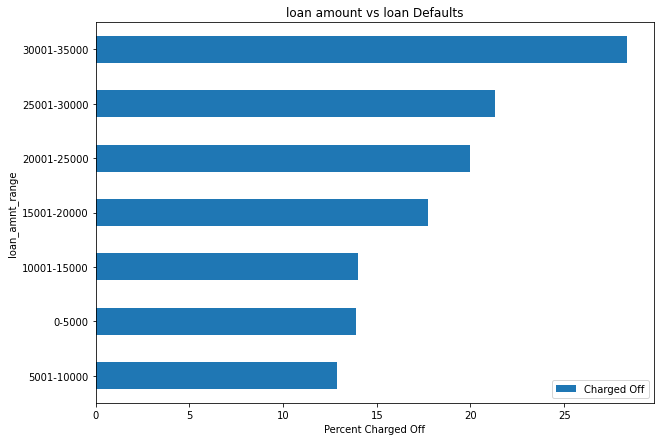

In [183]:
bi_analysis(temp, title="loan amount vs loan Defaults")

### 12.loan amount vs term
<b>`Findings`</b>
- `Larger loan amount tend to opt for 60 month term`

In [184]:
temp = pd.crosstab(data_clean['loan_amnt_range'],data_clean['term'])
temp.apply(lambda x:x/x.sum(),axis = 1)

term,36 months,60 months
loan_amnt_range,,
0-5000,0.891828,0.108172
5001-10000,0.839878,0.160122
10001-15000,0.706906,0.293094
15001-20000,0.563958,0.436042
20001-25000,0.510630,0.489370
25001-30000,0.282794,0.717206
30001-35000,0.227273,0.772727


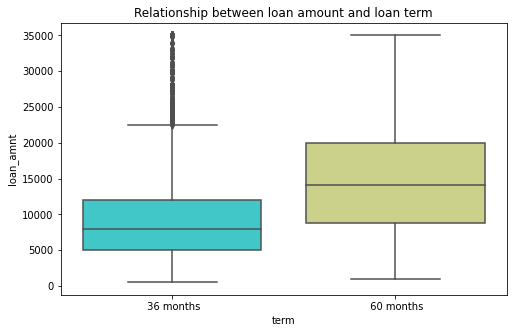

In [185]:
col = 'revol_bal'
plt.figure(figsize=(8,5))
sns.boxplot(y='loan_amnt',x='term',data=data_clean, palette='rainbow')
plt.title("Relationship between loan amount and loan term")
plt.show()

### 13. home_ownership vs loan status
<b>`Findings`</b>
- People belonging to 'OTHER' category in home_ownership tend to default more on loans

In [186]:
col = 'home_ownership'
temp = pd.crosstab(data_clean[col],data_clean['loan_status'])
temp.apply(lambda x:x/x.sum(),axis = 1)

loan_status,Charged Off,Fully Paid
home_ownership,,
MORTGAGE,0.139390,0.860610
NONE,0.000000,1.000000
OTHER,0.186813,0.813187
OWN,0.151908,0.848092
RENT,0.153292,0.846708


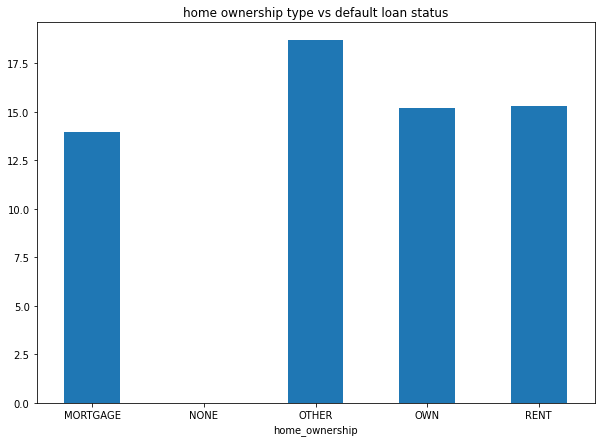

In [187]:
temp[
    list(temp.columns)
].apply(
    lambda x:x/x.sum()*100,
    axis=1
)['Charged Off'].plot.bar(
    rot = 0,
    figsize = (10,7),
    title = "home ownership type vs default loan status"
)
plt.show()

### 14.verification status vs loan status
<b>`Findings`</b>
- most of the loans belong to not verified catergory
-<b> `loans verified by LC tend to default the most at 17% `</b>
<br>

- Higher charged off status is seen in loans which were <b>`verified> verified by LC> not verified`<b>

In [188]:
col = 'verification_status'

In [189]:
temp = pd.crosstab(data_clean[col],data_clean['loan_status'])
temp.apply(lambda x:x/x.sum(),axis = 1)

loan_status,Charged Off,Fully Paid
verification_status,,
Not Verified,0.128414,0.871586
Source Verified,0.149390,0.850610
Verified,0.172808,0.827192


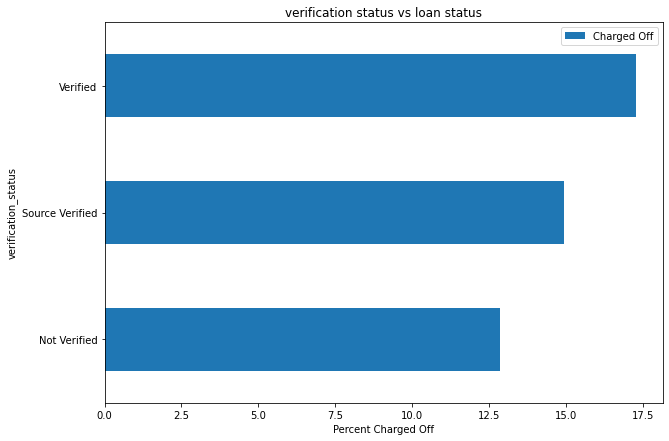

In [190]:
bi_analysis(temp,"verification status vs loan status")


### 15.addr_state vs loan_status

<b>`Findings`</b>
- State of NE(Nebraska) has a very high defaulter rate of 60%
- Top 5 states defaulting are-

    1. NE(Nebraska) - 60%
    2. NV(Nevada) - 22%
    3. SD(South Dakota) - 19%
    4. AK(ALASKA) - 18.3%
    5. FL(Florida) - 18.1%
    

In [191]:
col = 'addr_state'
temp = pd.crosstab(data_clean[col],data_clean['loan_status'])
temp.head()

loan_status,Charged Off,Fully Paid
addr_state,,
AK,13,58
AL,51,371
AR,26,202
AZ,116,697
CA,1076,5506


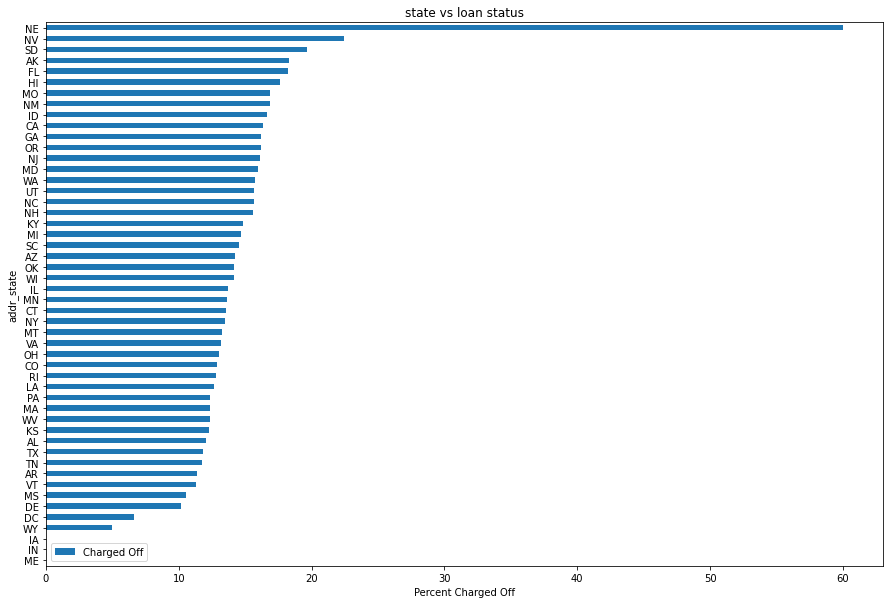

In [192]:
bi_analysis(temp, title="state vs loan status",fig = (15,10))

### 16.pub_rec_bankruptcies vs loan_status
<b>`Findings`</b>
- This colummn is related to loan status, 
- `the more public recorded bankrupties more are the chances of a person defaulting the loan`
- people with 2 bankrupy recorded lend to default as high as 40%
- <b>`Its risky to give loans to people wuth reported bankrupties`</b>

In [193]:
col = 'pub_rec_bankruptcies'
data_clean[col].value_counts()

0.0    35159
1.0     1601
2.0        5
Name: pub_rec_bankruptcies, dtype: int64

In [194]:
temp = pd.crosstab(data_clean[col],data_clean['loan_status'])
temp.apply(lambda x:x/x.sum(),axis = 1)

loan_status,Charged Off,Fully Paid
pub_rec_bankruptcies,,
0.0,0.143690,0.856310
1.0,0.225484,0.774516
2.0,0.400000,0.600000


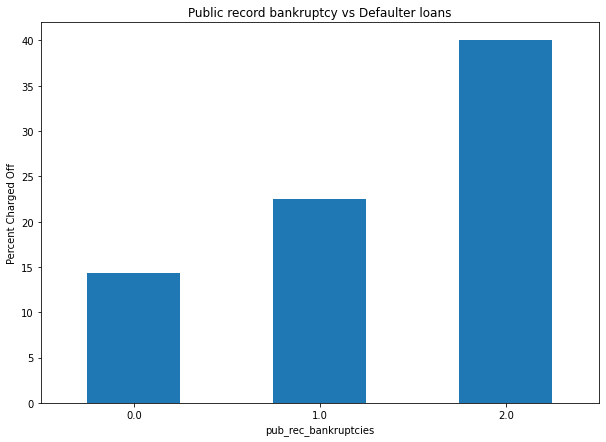

In [195]:
temp[list(temp.columns)].apply(lambda x:x/x.sum()*100,axis=1)['Charged Off'].plot.bar(rot = 0,figsize = (10,7),title = "Public record bankruptcy vs Defaulter loans")
plt.ylabel("Percent Charged Off")
plt.show()

### 17.open_to_total_credit_line_ratio vs loan_status
<b>`Defination`</b>

 
                   -open_to_total_credit_line_ratio = (open_acc/total_acc)*100

<b>`Findings`</b>
- No significant relationship seen between open_to_total_credit_line_ratio and loan status, this variable does not seem like a ocntributing factor to determine loan defaulter
                    

In [196]:
col ='open_to_total_credit_line_ratio'

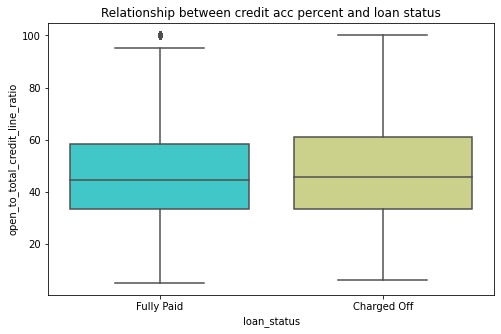

In [197]:
plt.figure(figsize=(8,5))
sns.boxplot(y=col,x='loan_status',data=data_clean, palette='rainbow')
plt.title("Relationship between credit acc percent and loan status")
plt.show()

### 18.inq_last_6mths vs loan_status
<b>`Findings`</b>
- we see a slight upward trend inenquires against loan_status
- <b>`when enquires increase defaulter loans tend to increase`</b>

In [198]:
temp = pd.crosstab(data_clean['inq_last_6mths'],data_clean['loan_status'])
temp.apply(lambda x:x/x.sum(),axis = 1)

loan_status,Charged Off,Fully Paid
inq_last_6mths,,
0,0.122593,0.877407
1,0.158718,0.841282
2,0.169685,0.830315
3,0.211147,0.788853
4,0.174658,0.825342
5,0.194030,0.805970
6,0.258621,0.741379
7,0.312500,0.687500
8,0.272727,0.727273


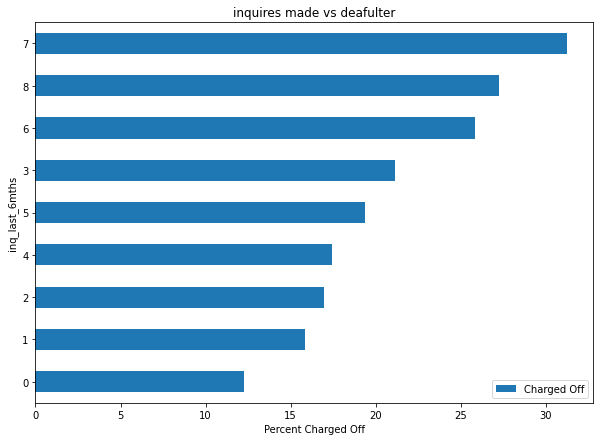

In [199]:
bi_analysis(temp,"inquires made vs deafulter")

In [200]:
col = 'inq_last_6mths'

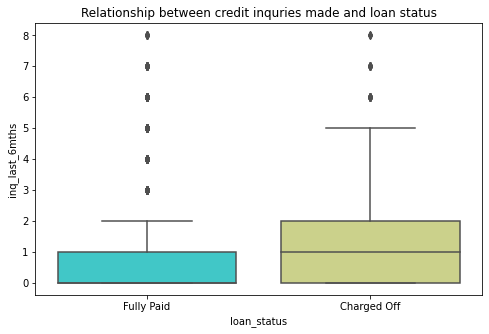

In [201]:
plt.figure(figsize=(8,5))
sns.boxplot(y=col,x='loan_status',data=data_clean, palette='rainbow')
plt.title("Relationship between credit inquries made and loan status")
plt.show()

### 20.revolving balance vs loan amnt
<b>`Findings`</b>
- no relationship seen between revolving balance and loan status

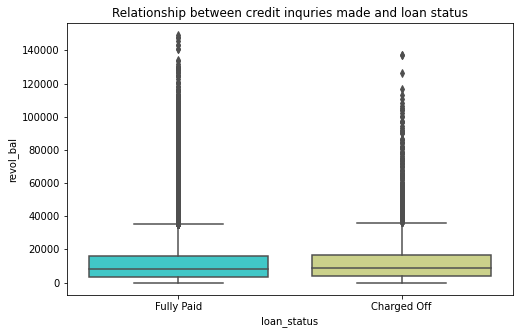

In [202]:
col = 'revol_bal'
plt.figure(figsize=(8,5))
sns.boxplot(y=col,x='loan_status',data=data_clean, palette='rainbow')
plt.title("Relationship between credit inquries made and loan status")
plt.show()

### 21. pub_rec vs loan_status

<b>`Findings`</b>

-`People belonging to category having 4 or 5 public record derogatory donot tend to default, these values can be outliers`
- from 1-3 pub_rec values percent of default chance increases

In [203]:
data_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,grade_sublevel_number,issue_d_month,issue_d_year,loan_income_ratio,open_to_total_credit_line_ratio,earliest_cr_line_month,earliest_cr_line_year,loan_amnt_range,int_rate_range,annual_inc_range,dti_range,installment_ranges,earlist_credit_line_year_ranges,loan_income_ratio_range
0,5000,36 months,10.65,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860xx,AZ,27.65,Jan-85,1,3,0,13648,83.7,9,0.0,2,Dec,2011,20.83,33.333333,Jan,1985,0-5000,11-15,0-25000,25%+,0-200,1980-1985,20-25
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309xx,GA,1.00,Apr-99,5,3,0,1687,9.4,4,0.0,4,Dec,2011,8.33,75.000000,Apr,1999,0-5000,16-20,25000-50000,0-5%,0-200,1995-2000,5-10
2,2400,36 months,15.96,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606xx,IL,8.72,Nov-01,2,2,0,2956,98.5,10,0.0,5,Dec,2011,19.59,20.000000,Nov,2001,0-5000,16-20,0-25000,5-10%,0-200,2000-2005,15-20
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917xx,CA,20.00,Feb-96,1,10,0,5598,21.0,37,0.0,1,Dec,2011,20.33,27.027027,Feb,1996,5001-10000,11-15,25000-50000,15-20%,200-400,1995-2000,20-25
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,wedding,852xx,AZ,11.20,Nov-04,3,9,0,7963,28.3,12,0.0,4,Dec,2011,13.89,75.000000,Nov,2004,0-5000,0-10,25000-50000,10-15%,0-200,2000-2005,10-15


In [204]:
temp = pd.crosstab(data_clean['pub_rec'],data_clean['loan_status'])
temp.apply(lambda x:x/x.sum(),axis = 1)

loan_status,Charged Off,Fully Paid
pub_rec,,
0,0.142643,0.857357
1,0.228266,0.771734
2,0.217391,0.782609
3,0.000000,1.000000
4,0.000000,1.000000


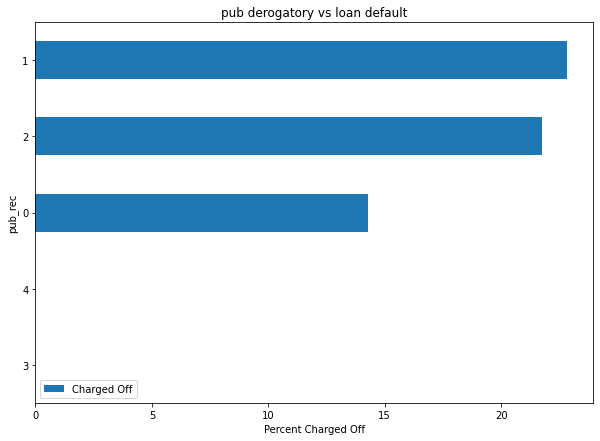

In [205]:
bi_analysis(temp,"pub derogatory vs loan default")

## Comment
## Multi
## Recom
## PPT
## README

## MULTIVARIATE Analysis

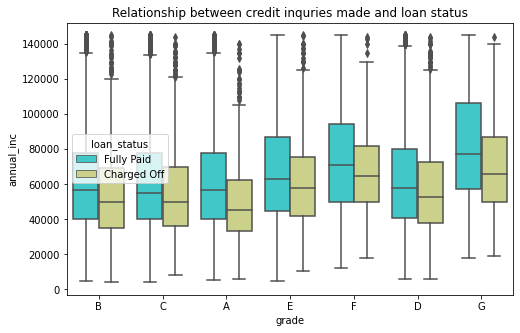

In [206]:
col = 'revol_bal'
plt.figure(figsize=(8,5))
sns.boxplot(y='annual_inc',x='grade',data=data_clean,hue = 'loan_status', palette='rainbow')
plt.title("Relationship between credit inquries made and loan status")
plt.show()

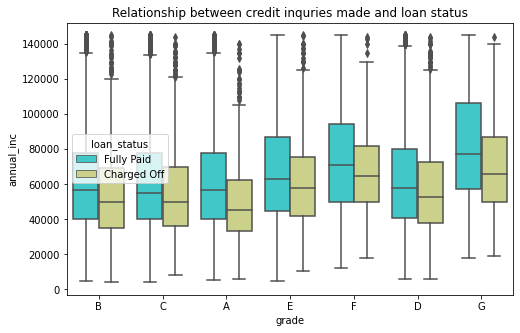

In [207]:
col = 'revol_bal'
plt.figure(figsize=(8,5))
sns.boxplot(y='annual_inc',x='grade',data=data_clean,hue = 'loan_status', palette='rainbow')
plt.title("Relationship between credit inquries made and loan status")
plt.show()

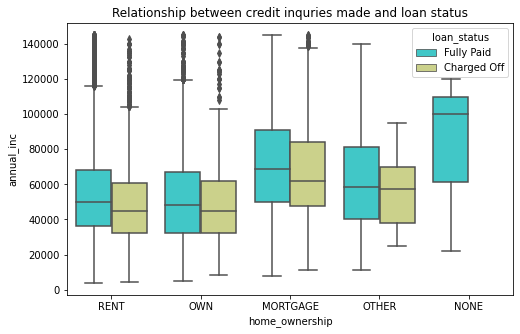

In [208]:
col = 'revol_bal'
plt.figure(figsize=(8,5))
sns.boxplot(y='annual_inc',x='home_ownership',data=data_clean,hue = 'loan_status', palette='rainbow')
plt.title("Relationship between credit inquries made and loan status")
plt.show()

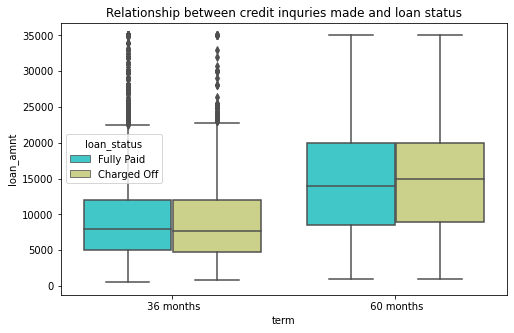

In [209]:
col = 'revol_bal'
plt.figure(figsize=(8,5))
sns.boxplot(y='loan_amnt',x='term',data=data_clean,hue = 'loan_status', palette='rainbow')
plt.title("Relationship between credit inquries made and loan status")
plt.show()

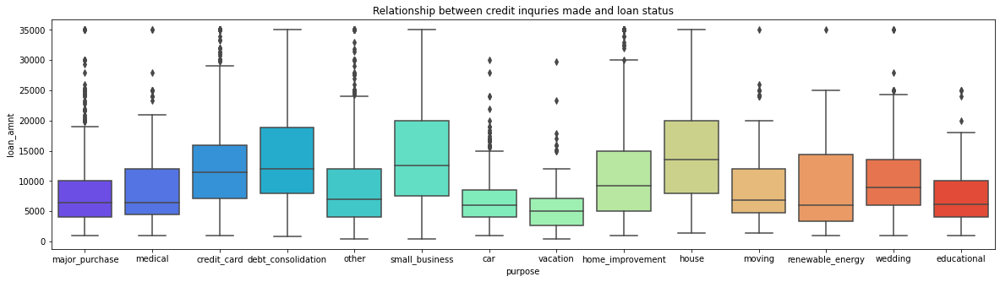

In [210]:
col = 'revol_bal'
plt.figure(figsize=(20,5))
temp = data_clean[data_clean['home_ownership']=='MORTGAGE']
sns.boxplot(y='loan_amnt',data=temp,x = 'purpose', palette='rainbow')
plt.title("Relationship between credit inquries made and loan status")
plt.show()

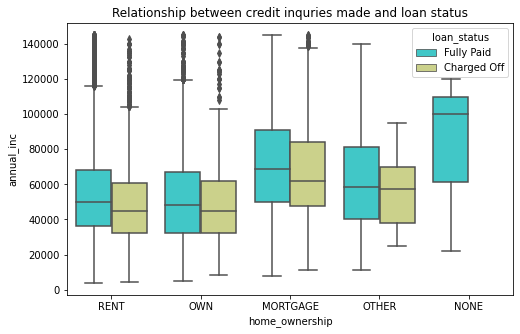

In [211]:
col = 'revol_bal'
plt.figure(figsize=(8,5))
sns.boxplot(y='annual_inc',x='home_ownership',data=data_clean,hue = 'loan_status', palette='rainbow')
plt.title("Relationship between credit inquries made and loan status")
plt.show()
## morgate vs purpose vs laon_status